In [30]:
import fwiVis.fwiVis as fv #somehow not including updates to code? 

import s3fs
s3 = s3fs.S3FileSystem(anon=False)
from math import cos, asin, sqrt
import re

import numpy as np
import geopandas as gpd
import pandas as pd
from matplotlib import pyplot as plt
import os
import rioxarray as rio
import xarray as xr
import rasterio
import glob
from geocube.api.core import make_geocube
from shapely.errors import ShapelyDeprecationWarning
from shapely.geometry import Point
import warnings
import folium
from folium import plugins
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)
import zarr #Didn't build into the env, needed to run "mamba install -c conda-forge zarr" took awhile, and was killed w/out mamba. Wait, it actually only worked with pip? 
import rasterio
from rasterio.plot import plotting_extent
import datetime as dt
from datetime import timedelta, date
#import imageio ## Need a diff script for image porcessing. 
#conda install -c conda-forge netCDF4 #maybe pip install? May have already been satisfied
# pip install h5netcdf


In [31]:
def daterange(date1, date2):
    for n in range(int ((date2 - date1).days)+1):
        yield date1 + timedelta(n)

start_dt = date(2021, 8, 1)
end_dt = date(2021, 9, 30)
dates = []
for dt in daterange(start_dt, end_dt):
    date = dt.strftime("%Y%m%d")
    #print(date)
    dates.append(date)

In [32]:
#s3.ls("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI")

In [33]:
fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_200207040000.d01.FWI.cog")

/tmp/ipykernel_305/388185563.py:1: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_200207040000.d01.FWI.cog")


In [34]:
#fwi.plot()

min_lat = 38.5
max_lat = 39
min_lon = -121
max_lon = -119.50

subset = fwi.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
#subset.plot()


In [194]:
files = s3.ls("s3://veda-data-store-staging/EIS/other/station-FWI/20170101.20221108.hrlyInterp/FWI/") # This will update through time. Not nessisary now because focus on 2019
st_id_map = pd.read_csv("/projects/my-public-bucket/fire_weather_vis/ref_data/isd-history.csv") ## For mappting ID's to lat lon

# Helper Variable
stations = fv.st_avail(files, st_id_map = st_id_map, path_s3 = "veda-data-store-staging/EIS/other/station-FWI/20170101.20221108.hrlyInterp/FWI/")
stations
st_dict = stations[['Lat', 'Lon']].to_dict('records')

#

foi = [{"Lat":38.586 , 
        "Lon":-120.537833 
    
}]
foi = pd.DataFrame(foi)
st_cls = fv.closest(st_dict, foi)
st = fv.get_st(lat = st_cls["Lat"], lon = st_cls["Lon"], stations = stations)

#gdf = gdf.sort_values(by = ['t']) ## Need to sort or timeseries jumps around
#gdf['t'] = gdf['t'].astype('datetime64[ns]')

st = st[st.time > "2021-08-01 12:00:00"]

st = st[st.time < "2021-09-30 12:00:00"]
full_fr = fv.fr_st_merge(gdf, st, sub = True)
#full_fr
st

## Subset to relvatn dates (from CAL FIRE)

# Start 08/14/21 6:54 PM,  End 10/21/21 8:18AM

st = st[st.time > "2021-08-01 12:00:00"]

st = st[st.time < "2021-09-30 12:00:00"]

Searching for availible stations atveda-data-store-staging/EIS/other/station-FWI/20170101.20221108.hrlyInterp/FWI/
The closest station is 23.48698806042275 km away.


/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:127: DtypeWarning: Columns (14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)
/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:127: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)


In [36]:
st_cls["Lat"]

38.717

In [37]:
st_id_map

st_id_map[(st_id_map.LAT.astype("float") == st_cls["Lat"]) & (st_id_map.LON.astype("float") == st_cls["Lon"])]

,USAF,WBAN,STATION NAME,CTRY,STATE,ICAO,LAT,LON,ELEV(M),BEGIN,END
17568,720645,227,PLACERVILLE AIRPORT,US,CA,KPVF,38.717,-120.75,787.3,20090711,20220926


In [161]:
st_id_map[(st_id_map["ELEV(M)"] > 1000) & (st_id_map["ELEV(M)"] > -999) & (st_id_map["STATE"] == 'CA')]

#st_id_map[st_id_map["STATION NAME"] == "NORTH BEND MUNI AIRPORT"]
st_id_map[st_id_map["STATION NAME"] == "BISHOP AIRPORT"]

,USAF,WBAN,STATION NAME,CTRY,STATE,ICAO,LAT,LON,ELEV(M),BEGIN,END
19674,724800,23157,BISHOP AIRPORT,US,CA,KBIH,37.371,-118.359,1252.9,19430116,20220926
28864,999999,23157,BISHOP AIRPORT,US,CA,KBIH,37.371,-118.358,1263.4,19480104,19721231


In [132]:
nrth_bnd = st_id_map[st_id_map["STATION NAME"] == "NORTH BEND MUNI AIRPORT"]
nrth_bnd = nrth_bnd.rename(columns = {"LAT":"Lat", 
                                     "LON":'Lon'})
nrth_bnd.Lon.unique()
#stations
#print(stations.reset_index(drop=True) == nrth_bnd.reset_index(drop=True))
#stations.sort_index().sort_index(axis=1) == nrth_bnd.sort_index().sort_index(axis=1)

print(nrth_bnd["Lat"].astype("float").unique()) 
print(nrth_bnd["Lon"].astype('float').unique())

high_elev = st_id_map[st_id_map["STATION NAME"] == "BISHOP AIRPORT"]


print(high_elev["LAT"].astype("float").unique()) 
print(high_elev["LON"].astype('float').unique())

[43.413]
[-124.244]
[37.371]
[-118.359 -118.358]


In [139]:
st = stations.loc[(stations.Lat.astype("float") == 43.413 ) & (stations.Lon.astype("float") == -124.244)]
#dat = pd.read_csv("s3://veda-data-store-staging/EIS/other/station-FWI/20000101.20220907.hrlyInterp/FWI/727970-94240.spline.DailyFWIfromHourlyInterp.csv")
dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)
dat = fv.date_convert(dat)

north_bend_low_elevation = dat
north_bend_low_elevation["Lat"] = 43.413
north_bend_low_elevation["Lon"] = -124.244

st = stations.loc[(stations.Lat.astype("float") == 37.371 ) & (stations.Lon.astype("float") == -118.359)]
#dat = pd.read_csv("s3://veda-data-store-staging/EIS/other/station-FWI/20000101.20220907.hrlyInterp/FWI/727970-94240.spline.DailyFWIfromHourlyInterp.csv")
dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)
dat = fv.date_convert(dat)
high_elev = dat
high_elev["Lat"] = 37.371 
high_elev["Lon"] = -118.359



#north_bend_low_elevation = fv.get_st(lat = nrth_bnd["Lat"].astype("float").unique(), lon = nrth_bnd["Lon"].astype('float').unique(), stations = stations)

/tmp/ipykernel_305/345974537.py:3: DtypeWarning: Columns (14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)
/tmp/ipykernel_305/345974537.py:3: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)
/tmp/ipykernel_305/345974537.py:12: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)


In [63]:
fireID = '0'
gdf = fv.load_large_fire(fireID, year = "2021", path_region="Caldor")
gdf['timediff'] = gdf.t.astype("datetime64[ns]") - pd.to_datetime("2021-08-14 18:00:00")
gdf['timediff'] = gdf.timediff.astype("int")
#gdf["t"] = gdf["t"].astype("str")
gdf.t.astype("datetime64[ns]")
gdf = gdf.sort_values(by = ["t"])
#gdf.set_index("t")

/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:426: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lon'] = gdf.centroid.x
/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:427: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lat'] = gdf.centroid.y


In [64]:
# veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_200207040000.d01.FWI.cog 
# d0 = 0
# len_days = len(dates)
# for i in range(len_days - 1, len_days):
#     print(i)
#     root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + dates[i] +"0000.d01.FWI.cog")
#     subset = root_moist.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
#     f, ax = plt.subplots()
#     subset.plot(ax = ax, cmap = "bwr",  vmin = 0, vmax = 100, label = "FWI") # vmin = 0, vmax = 1,
#     #ax.set_xlable("Longitude")
#     #ax.xlable("Longitude")
#     #sub_plot = ax.plot(subset, cmap = "bwr_r", vmin= 1, vmax = 1)
#     if(i <= 6):

#         gdf[d0:i].plot(ax=ax, facecolor="none", edgecolor='none')
#     if(i > 6):
#         index = i - 6
#         gdf[d0:index].plot(ax=ax, facecolor="yellow", edgecolor='black') #facecolor="None"
#     #ax.xlable("Longitude")
#     ax.set_ylabel("Latitude", color = "black")
#     ax.set_xlabel("Longitude", color = "black")
#     ax.set_title("FWI", color = "black")
#     #ax.spines["bottom"].set_color('white')
#     #ax.spines["top"].set_color('white')
#     #ax.spines["left"].set_color('white')
#     #ax.spines["right"].set_color('white')
#     #ax.xaxis.label.set_color('white')
#     #ax.tick_params(colors='white')
#     #plt.savefig(fname = (""+ m + "_vs_" + f+".pdf"))
#     #params = {"text.color" : "white",
#     #      "xtick.color" : "white",
#     #      "ytick.color" : "white"}
#     #plt.rcParams.update(params)
#     if(i < 10):
#         i_write = "0" + str(i)
#     else:
#         i_write = str(i)
#     #plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/SW_fig/Caldor_Soil_moisture_raster_' + i_write + '.png', transparent=True, dpi = 450)
#     plt.show()

In [65]:
# IMERGE Data Read in. 
#s3.ls("s3://veda-data-store-staging/EIS/zarr/GEOS5_FWI_GPM_LATE_v5_Daily.zarr/GPM.LATE.v5_FWI/0.0.0")
geos_fwi = xr.open_dataset("s3://veda-data-store-staging/EIS/zarr/GEOS5_FWI_GPM_LATE_v5_Daily.zarr", engine="zarr")
geos_fwi


<xarray.Dataset>
Dimensions:           (time: 3250, lat: 1330, lon: 3600)
Coordinates:
  * lat               (lat) float64 -57.95 -57.85 -57.75 ... 74.75 74.85 74.95
  * lon               (lon) float64 -179.9 -179.8 -179.8 ... 179.8 179.9 179.9
  * time              (time) datetime64[ns] 2014-05-01 2014-05-02 ... 2023-03-24
Data variables:
    GPM.LATE.v5_BUI   (time, lat, lon) float32 ...
    GPM.LATE.v5_DC    (time, lat, lon) float32 ...
    GPM.LATE.v5_DMC   (time, lat, lon) float32 ...
    GPM.LATE.v5_DSR   (time, lat, lon) float32 ...
    GPM.LATE.v5_FFMC  (time, lat, lon) float32 ...
    GPM.LATE.v5_FWI   (time, lat, lon) float32 ...
    GPM.LATE.v5_ISI   (time, lat, lon) float32 ...
Attributes: (12/46)
    Center:              NASA GISS / Columbia University
    Center::             center
    DCDryStartFactor:    5.0
    DCDryStartFactor::   DC number of days since precip mult factor for dry s...
    DCStart:             15.0
    DCStart::            DC starting value after wet winter
    ...                  ...
    snowCoverDaysCalc:   60.0
    snowCoverDaysCalc::  Number of days prior to spring over which to determi...
    startShutDays:       2.0
    startShutDays::      Number of previous days over which to consider start...
    tempThresh:          6.0
    tempThresh::         Temp thresh (C) to define start and end of winter

In [22]:

#geos_fwi.
#geos_short = geos_fwi.where((geos_fwi.time.astype("datetime64[ns]") > dt.datetime.strptime("2021-08-01", "%Y-%m-%d")) & (geos_fwi.time.astype("datetime64[ns]") < dt.strptime("2021-09-30", "%Y-%m-%d")))

In [23]:
#geos_fwi = geos_fwi.rio.set_spatial_dims(x_dim= "lat", y_dim = "lon") # 
#?geos_fwi.set_coords

In [66]:
g_fwi  = geos_fwi["GPM.LATE.v5_FWI"]
#g_fwi = g_fwi.rio.set_spatial_dims(x_dim= "lat", y_dim = "lon")
#print(min_lon)
#g_fwi.lon

#gsmall = g_fwi.sel(time ="2021-08", drop = True)

min_lat = 38.5
max_lat = 39.0
min_lon = -121.0 
max_lon = -119.50

gsmall = g_fwi.sel(lat = slice(min_lat, max_lat), lon = slice(min_lon, max_lon))
gffmc = geos_fwi["GPM.LATE.v5_FFMC"]
gisi = geos_fwi["GPM.LATE.v5_ISI"]
gdc = geos_fwi["GPM.LATE.v5_DC"]
gdmc = geos_fwi["GPM.LATE.v5_DMC"]

In [67]:
#gsmall.sel(time = "2021-08-01").plot()

In [68]:
# #foi = [{"Lat":38.586 ,    ### Fire center lat and lon
# #        "Lon":-120.537833 
# #    
# #}]
# print("Station lat", st_cls["Lat"])
# print("Sstation lon", st_cls["Lon"])

# gsmall.sel(lat = 38.717, lon = -120.75, method='nearest').plot()

In [187]:
## Both rasters at once



date_df = pd.DataFrame()
date_df["dates_fl"] = dates

#date_df["dates_fl"] = dates_long
date_df["dates_clean"] = date_df["dates_fl"].astype("datetime64[ns]")


date_df

,dates_fl,dates_clean
0,20210801,2021-08-01
1,20210802,2021-08-02
2,20210803,2021-08-03
3,20210804,2021-08-04
4,20210805,2021-08-05
...,...,...
56,20210926,2021-09-26
57,20210927,2021-09-27
58,20210928,2021-09-28
59,20210929,2021-09-29


In [70]:
# len_days = len(date_df.dates_fl)

# for i in range(1, len_days):
#     print(i)
#     ## Static Plot with Doug's feedback
#     f, (ax3, ax) = plt.subplots(1, 2, figsize=(20,8))
    
#         ## Adding the raster
#     root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")
#     subset = root_moist.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
#     subset.plot(ax = ax3, cmap = "bwr", vmin = 0, vmax = 100, label = "LIS FWI")
#     #ax.set_xlable("Longitude")
#     #ax.xlable("Longitude")
#     #sub_plot = ax.plot(subset, cmap = "bwr_r", vmin= 1, vmax = 1)
#     #if(i <= 6):

#     gdf[d0:i].plot(ax=ax3, facecolor="none", edgecolor='none')
    
#     if(i > 6):
#         index = i - 6
#         gdf[d0:index].plot(ax=ax3, facecolor="yellow", edgecolor='black') #facecolor="None"
#     #ax.xlable("Longitude")
#     ax3.set_ylabel("Latitude", color = "black")
#     ax3.set_xlabel("Longitude", color = "black")
#     ax3.set_title(("LIS FWI" + str(date_df.dates_clean[i]) ), color = "black")
#     ax3.scatter(y = 38.717, x = -120.75, color = "orange", s = 300, edgecolors= "black")

#     if(i < 10):
#         i_write = "0" + str(i)
#     else:
#         i_write = str(i)

#     gsmall.sel(time = date_df.dates_clean[i]).plot(ax = ax, cmap = "bwr", vmin = 0, vmax = 100)
#     gdf[d0:i].plot(ax=ax, facecolor="none", edgecolor='none')
#     ax.set_title(("IMERGE FWI" + str(date_df.dates_clean[i])))
#     ax.scatter(y = 38.717, x = -120.75, color = "orange", s = 300, edgecolors= "black")
    
#     params = {"text.color" : "black",
#           "xtick.color" : "black",
#           "ytick.color" : "black"}
#     plt.rcParams.update(params)
    
#     if(i > 6):
#         index = i - 6
#         gdf[d0:index].plot(ax=ax, facecolor="yellow", edgecolor='black') #facecolor="None"


#     ## The save statement
#     #plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/fwi_fig_multi/FWI_mulit_'+ i_write +'.png', dpi = 200)
#     #plt.show()

In [72]:
# st = st.rename(columns={"time":"t"})
# full_fr = pd.merge(gdf,st, on = "t", how = "outer")
# full_fr = full_fr.sort_values(by = ['t'])
# type(full_fr)

In [ ]:
root_moist

In [182]:
## Need to read in all the LIS date for time series

#### Placerville
d0 = 0
len_days = len(date_df.dates_fl)
fwi_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog").sel(y = 38.717, x = -120.75, method='nearest')
    mean_fwi = float(tmp_fwi.mean())
    fwi_LIS[i] = mean_fwi

#### The North Bend low elevation



### High elevation 

/tmp/ipykernel_305/2268745660.py:8: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_305/2268745660.py:8: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_305/2268745660.py:8: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transit

In [179]:
fwi_LIS
date_df["fwi_list"] = fwi_LIS

gsmaller = gsmall.sel(lat = 38.717, lon = -120.75,  method='nearest') ## based on station lat and lon

In [180]:
sudo_full_fr = full_fr[full_fr.t.dt.hour == 12]
#sudo_full_fr

## All timeseries on one plot
f, (ax) = plt.subplots(1, figsize=(10,5))

#ax.plot(sudo_full_fr.t, sudo_full_fr.FWI, color = "orange", label = "Placerville Airport Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.fwi_list, color = "purple", label = "LIS")
#gsmaller.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()



ax.set_ylabel("Fire Weather Index",color="red")
#full_fr.t.dt.hour

Text(0, 0.5, 'Fire Weather Index')

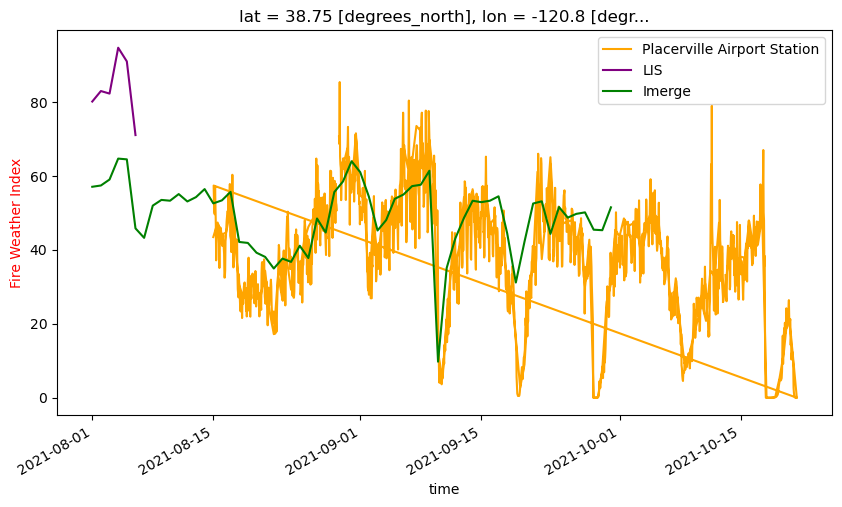

In [176]:
## All timeseries on one plot
f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.FWI, color = "orange", label = "Placerville Airport Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.fwi_list, color = "purple", label = "LIS")
gsmaller.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()



ax.set_ylabel("Fire Weather Index",color="red")

In [34]:
ffmc_files = s3.ls("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC")
print(ffmc_files[0])
s3.ls("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/")



veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC/LIS_FWI_COMP_20UTC_200201010000.d01.FFMC.cog


['veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/BUI',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DC',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DMC',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI']

In [35]:
## Looking at component parts of FWI, FFMC

d0 = 0
len_days = len(date_df.dates_fl)
ffmc_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_ffmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FFMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
    mean_ffmc = float(tmp_ffmc.mean())
    ffmc_LIS[i] = mean_ffmc
    
date_df["ffmc_lis"] = ffmc_LIS

/tmp/ipykernel_7980/1656076559.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_ffmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FFMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/1656076559.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_ffmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FFMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/1656076559.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information abou

In [36]:
gffmc_small = gffmc.sel(lat = 38.717, lon = -120.75, method='nearest') # lat = 38.717, lon = -120.75

Text(0, 0.5, 'FFMC')

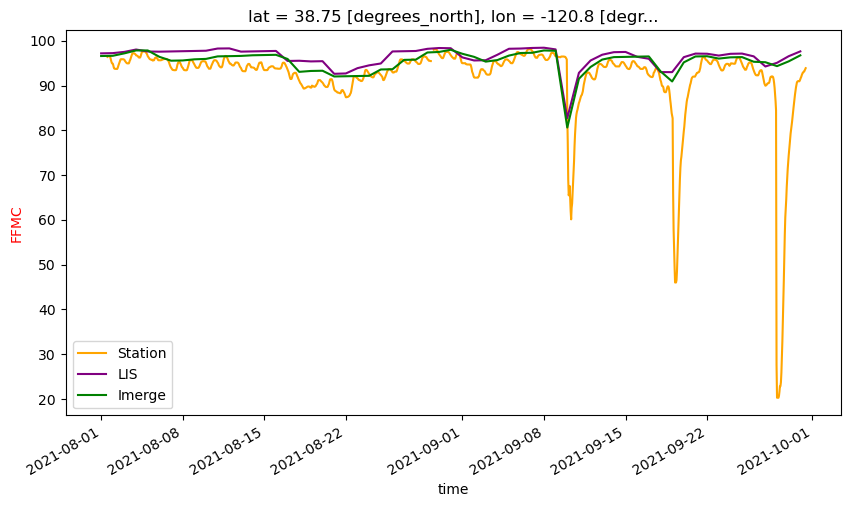

In [37]:
f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.FFMC, color = "orange", label = "Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.ffmc_lis, color = "purple", label = "LIS")
gffmc_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()



ax.set_ylabel("FFMC",color="red")

In [83]:
north_bend_low_elevation.Lat

43.413

In [190]:
## ISI


## Placerville
d0 = 0
len_days = len(date_df.dates_fl)
isi_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_isi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.ISI.cog").sel(y = 38.717, x = -120.75, method='nearest')
    #print(float(tmp_isi.mean()))
    mean_isi = float(tmp_isi.mean())
    isi_LIS[i] = mean_isi
    
date_df["isi_lis"] = isi_LIS


#### The North Bend low elevation

d0 = 0
len_days = len(date_df.dates_fl)
isi_LIS_nb = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_isi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.ISI.cog").sel(y = north_bend_low_elevation.Lat.unique(), x = north_bend_low_elevation.Lon.unique(), method='nearest')
    #print(float(tmp_isi.mean()))
    mean_isi = float(tmp_isi.mean())
    isi_LIS_nb[i] = mean_isi
    
date_df["isi_lis_nb"] = isi_LIS_nb


### High elevation 

d0 = 0
len_days = len(date_df.dates_fl)
isi_LIS_he = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_isi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.ISI.cog").sel(y = high_elev.Lat.unique(), x = high_elev.Lon.unique(), method='nearest')
    #print(float(tmp_isi.mean()))
    mean_isi = float(tmp_isi.mean())
    isi_LIS_he[i] = mean_isi
    
date_df["isi_lis_he"] = isi_LIS_he


/tmp/ipykernel_305/2149815821.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_isi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.ISI.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_305/2149815821.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_isi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.ISI.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_305/2149815821.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transit

In [199]:
full_fr = full_fr.sort_values(by = "t")


gisi_small = gisi.sel(lat = 38.717, lon = -120.75, method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.ISI, color = "orange", label = "Placerville Weather Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.isi_lis, color = "purple", label = "LIS")
gisi_small.sel(time = slice("2021-08-15", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("ISI",color="red")

Text(0, 0.5, 'ISI')

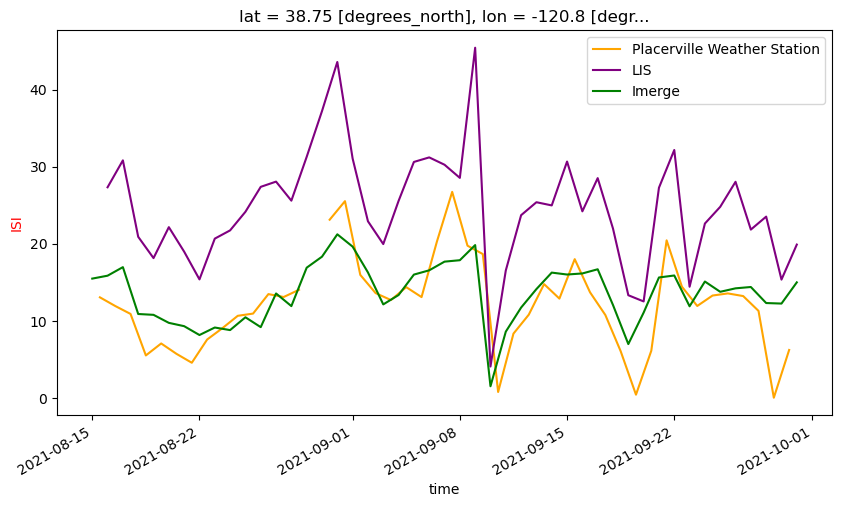

In [201]:
sudo_full_fr = full_fr[full_fr.t.dt.hour == 12]
sudo_df = date_df[date_df.dates_clean > "2021-08-15"]

gisi_small = gisi.sel(lat = 38.717, lon = -120.75, method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(sudo_full_fr.t, sudo_full_fr.ISI, color = "orange", label = "Placerville Weather Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(sudo_df.dates_clean, sudo_df.isi_lis, color = "purple", label = "LIS")
gisi_small.sel(time = slice("2021-08-15", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("ISI",color="red")

In [143]:
list_to_grep = ['i']
def _grep(x, list_to_grep):
    """takes a string (x) and checks whether any string from a given 
       list of strings (list_to_grep) exists in `x`"""
    for text in list_to_grep:
        if text.lower() in x.lower():
            return False
    return True

mask =north_bend_low_elevation.ISI.astype("str").apply(_grep, list_to_grep=list_to_grep)
north_bend_low_elevation = north_bend_low_elevation[mask]

#set(north_bend_low_elevation.ISI == '20.919-3.5771e-08i')

#re.search("i", north_bend_low_elevation.ISI)
#?re.search
#north_bend_low_elevation.ISI.apply(re.search, "i")
#north_bend_low_elevation.ISI[north_bend_low_elev]

In [148]:
date_df

,dates_fl,dates_clean,isi_lis,isi_lis_nb,isi_lis_he
0,20210801,2021-08-01,31.775814,10.540648,8.638653
1,20210802,2021-08-02,33.605122,7.025721,16.565989
2,20210803,2021-08-03,33.022442,8.638433,25.647240
3,20210804,2021-08-04,41.925732,10.316116,31.413914
4,20210805,2021-08-05,39.053631,6.688255,64.738968
...,...,...,...,...,...
56,20210926,2021-09-26,28.048513,15.291580,13.236120
57,20210927,2021-09-27,21.846199,1.398838,22.966610
58,20210928,2021-09-28,23.528856,1.351120,14.906826
59,20210929,2021-09-29,15.356982,3.945187,19.167213


In [150]:
north_bend_low_elevation = north_bend_low_elevation[(north_bend_low_elevation.time.astype("datetime64[ns]") > min(date_df.dates_clean))]

north_bend_low_elevation = north_bend_low_elevation[(north_bend_low_elevation.time.astype("datetime64[ns]") < max(date_df.dates_clean))]

In [153]:

north_bend_low_elevation

,YYYY,MM,DD,HH,TEMP_C,RH_PERC,VPD_HPA,WDSPD_KPH,PREC_MM,SNOWD_M,...,FWI,OBSMINUTEDIFFTEMP,OBSMINUTEDIFFRH,OBSMINUTEDIFFWDSPD,OBSMINUTEDIFFPREC,OBSMINUTEDIFFSNOW,HH_format,time,Lat,Lon
40161,2021,8,1,1,13.923,95.946,0.64520,16.3920,0.0,0,...,9.1012,4,4,4,4,NaN,01,2021-08-01 01:00:00,43.413,-124.244
40162,2021,8,1,2,13.911,93.038,1.10770,15.0490,0.0,0,...,8.5857,4,4,4,4,NaN,02,2021-08-01 02:00:00,43.413,-124.244
40163,2021,8,1,3,14.437,92.942,1.16160,22.6030,0.0,0,...,11.799,4,4,4,4,NaN,03,2021-08-01 03:00:00,43.413,-124.244
40164,2021,8,1,4,14.333,90.197,1.60520,20.1280,0.0,0,...,10.662,4,4,4,4,NaN,04,2021-08-01 04:00:00,43.413,-124.244
40165,2021,8,1,5,13.298,92.962,1.07600,12.2970,0.0,0,...,7.5991,4,4,4,4,NaN,05,2021-08-01 05:00:00,43.413,-124.244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41595,2021,9,29,19,14.905,84.069,2.70210,5.5418,0.0,0,...,0.94612,4,4,4,4,NaN,19,2021-09-29 19:00:00,43.413,-124.244
41596,2021,9,29,20,13.857,89.595,1.64940,7.7874,0.0,0,...,1.3083,4,4,4,4,NaN,20,2021-09-29 20:00:00,43.413,-124.244
41597,2021,9,29,21,13.234,90.165,1.49900,11.2780,0.0,0,...,1.8972,4,4,4,4,NaN,21,2021-09-29 21:00:00,43.413,-124.244
41598,2021,9,29,22,12.163,93.106,0.97737,11.1320,0.0,0,...,1.8798,4,4,4,4,NaN,22,2021-09-29 22:00:00,43.413,-124.244


In [158]:
gisi_small = gisi.sel(lat = north_bend_low_elevation.Lat[40161], lon = north_bend_low_elevation.Lon[40161], method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(north_bend_low_elevation.time.astype("datetime64[ns]"), north_bend_low_elevation.ISI, color = "orange", label = "North Bend Weather Station"  )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.isi_lis_nb, color = "purple", label = "LIS")
gisi_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("ISI",color="red")
plt.title("Elevatino 5.2 m")

Text(0.5, 1.0, 'Elevatino 5.2 m')

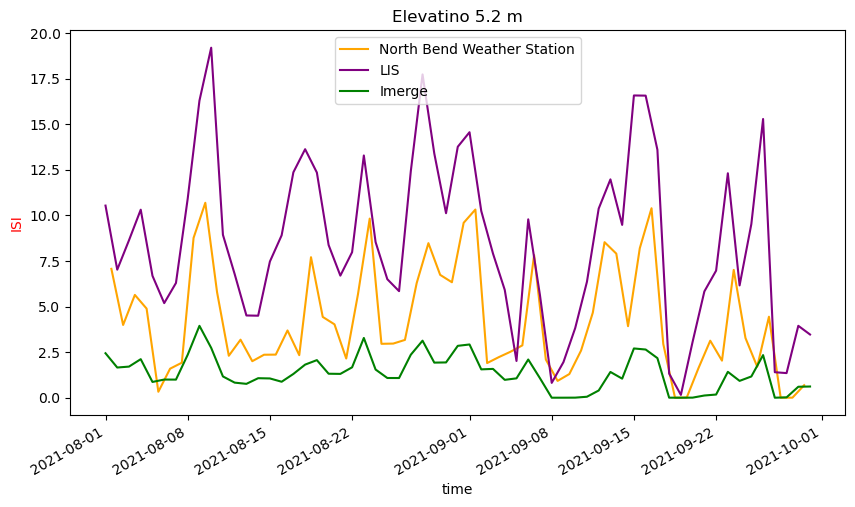

In [203]:
sudo_north_bend_low_elevation = north_bend_low_elevation[north_bend_low_elevation.time.dt.hour == 12]

gisi_small = gisi.sel(lat = north_bend_low_elevation.Lat[40161], lon = north_bend_low_elevation.Lon[40161], method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(sudo_north_bend_low_elevation.time.astype("datetime64[ns]"), sudo_north_bend_low_elevation.ISI, color = "orange", label = "North Bend Weather Station"  )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.isi_lis_nb, color = "purple", label = "LIS")
gisi_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("ISI",color="red")
plt.title("Elevatino 5.2 m")

In [160]:
high_elev = high_elev[(high_elev.time.astype("datetime64[ns]") > min(date_df.dates_clean))]

high_elev = high_elev[(high_elev.time.astype("datetime64[ns]") < max(date_df.dates_clean))]
high_elev

,YYYY,MM,DD,HH,TEMP_C,RH_PERC,VPD_HPA,WDSPD_KPH,PREC_MM,SNOWD_M,...,FWI,OBSMINUTEDIFFTEMP,OBSMINUTEDIFFRH,OBSMINUTEDIFFWDSPD,OBSMINUTEDIFFPREC,OBSMINUTEDIFFSNOW,HH_format,time,Lat,Lon
40161,2021,8,1,1,19.878,50.782,11.4330,11.5270,0.0,0,...,37.264,4,4,4,4,NaN,01,2021-08-01 01:00:00,37.371,-118.359
40162,2021,8,1,2,18.299,54.182,9.6405,9.5141,0.0,0,...,33.512,4,4,4,4,NaN,02,2021-08-01 02:00:00,37.371,-118.359
40163,2021,8,1,3,18.835,52.496,10.3480,14.5870,0.0,0,...,38.385,4,4,4,4,NaN,03,2021-08-01 03:00:00,37.371,-118.359
40164,2021,8,1,4,17.200,58.143,8.2210,7.5600,0.0,0,...,29.180,0,0,0,0,NaN,04,2021-08-01 04:00:00,37.371,-118.359
40165,2021,8,1,5,15.571,61.979,6.7187,9.4714,0.0,0,...,29.736,4,4,4,4,NaN,05,2021-08-01 05:00:00,37.371,-118.359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41595,2021,9,29,19,18.271,11.575,18.5950,24.2460,0.0,0,...,83.312,4,4,4,4,NaN,19,2021-09-29 19:00:00,37.371,-118.359
41596,2021,9,29,20,16.626,14.563,16.1720,20.5450,0.0,0,...,74.431,4,4,4,4,NaN,20,2021-09-29 20:00:00,37.371,-118.359
41597,2021,9,29,21,15.998,15.825,15.3280,21.8000,0.0,0,...,76.860,4,4,4,4,NaN,21,2021-09-29 21:00:00,37.371,-118.359
41598,2021,9,29,22,14.400,17.514,13.5490,11.1600,0.0,0,...,55.153,0,0,0,0,NaN,22,2021-09-29 22:00:00,37.371,-118.359


Text(0.5, 1.0, 'Elevatino 1252.9 m')

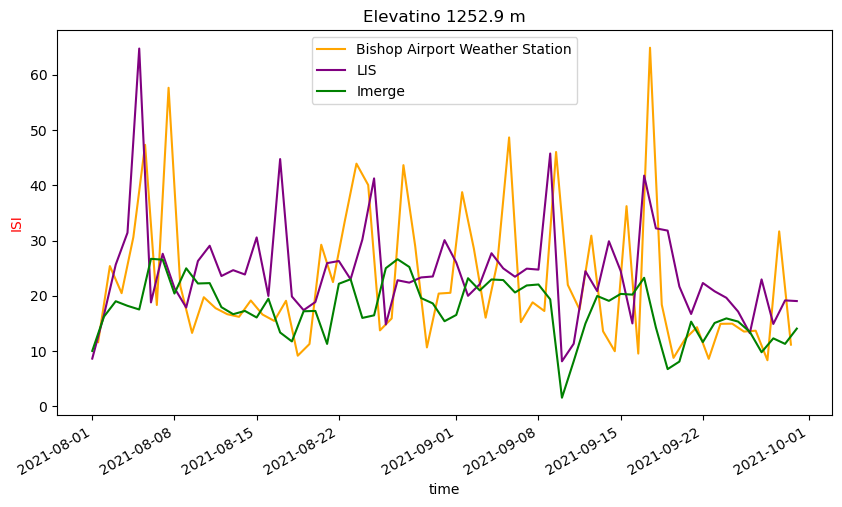

In [205]:
sudo_high_elev = high_elev[high_elev.time.dt.hour == 12]

gisi_small = gisi.sel(lat = high_elev.Lat[40161], lon = high_elev.Lon[40161], method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(sudo_high_elev.time.astype("datetime64[ns]"), sudo_high_elev.ISI, color = "orange", label = "Bishop Airport Weather Station"  )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.isi_lis_he, color = "purple", label = "LIS")
gisi_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("ISI",color="red")
plt.title("Elevatino 1252.9 m")

In [40]:
## DMC

d0 = 0
len_days = len(date_df.dates_fl)
dmc_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_dmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
    #print(float(tmp_isi.mean()))
    mean_dmc = float(tmp_dmc.mean())
    dmc_LIS[i] = mean_dmc
    
date_df["dmc_lis"] = dmc_LIS

/tmp/ipykernel_7980/1461541077.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_dmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/1461541077.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_dmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/1461541077.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about tran

Text(0, 0.5, 'DMC')

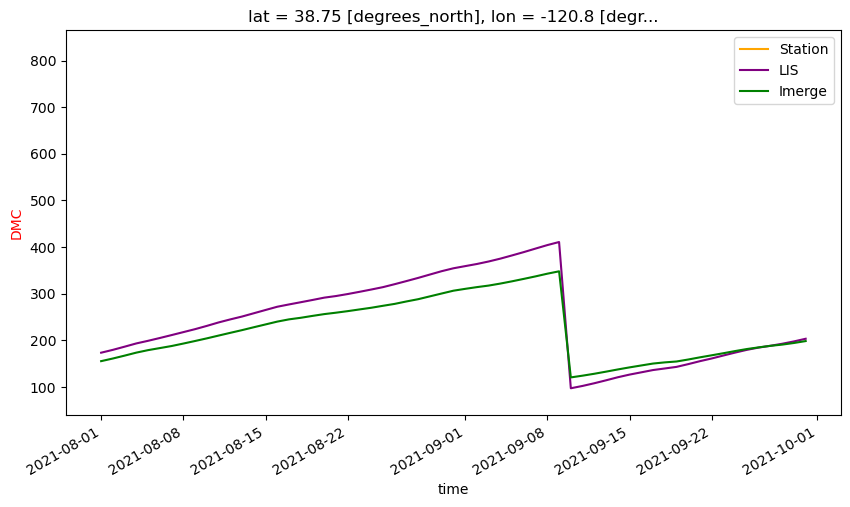

In [41]:
gdmc_small = gdmc.sel(lat = 38.717, lon = -120.75, method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.DMC, color = "orange", label = "Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.dmc_lis, color = "purple", label = "LIS")
gdmc_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("DMC",color="red")

In [42]:
d0 = 0
len_days = len(date_df.dates_fl)
dc_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_dc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DC.cog").sel(y = 38.717, x = -120.75, method='nearest')
    #print(float(tmp_isi.mean()))
    mean_dc = float(tmp_dc.mean())
    dc_LIS[i] = mean_dc
    
date_df["dc_lis"] = dc_LIS

/tmp/ipykernel_7980/3013133336.py:5: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_dc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/3013133336.py:5: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_dc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/3013133336.py:5: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transition

Text(0, 0.5, 'DC')

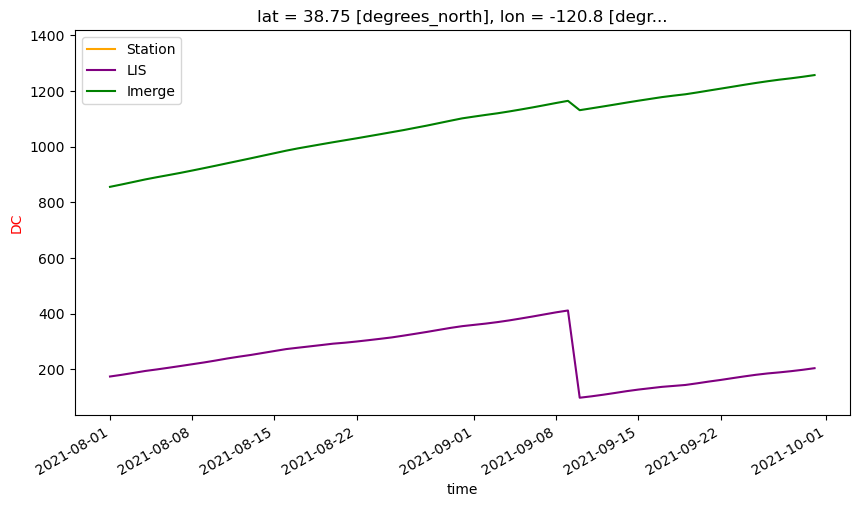

In [43]:
gdc_small = gdc.sel(lat = 38.717, lon = -120.75, method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.DC, color = "orange", label = "Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.dmc_lis, color = "purple", label = "LIS")
gdc_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("DC",color="red")

In [44]:
# Making the HQ update figure with just IMERGE

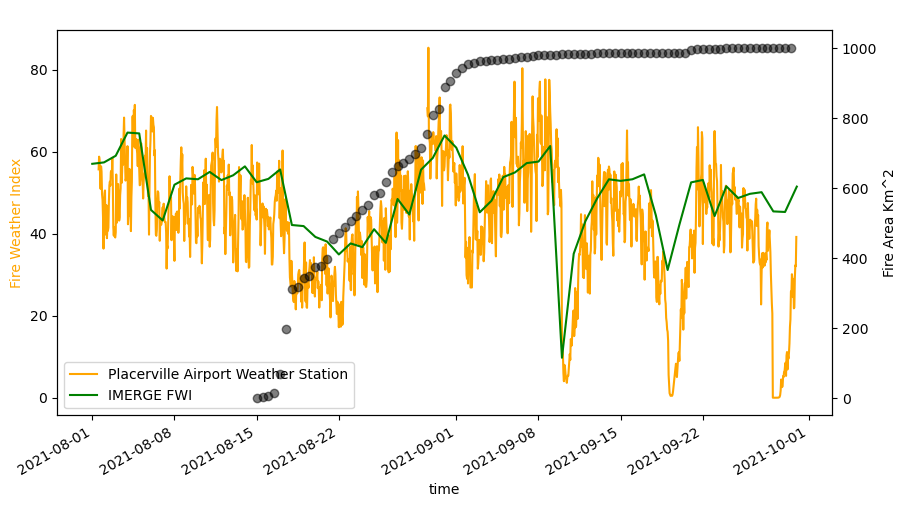

In [45]:
full_fr = full_fr[full_fr.t < "2021-09-30"]

## All timeseries on one plot
f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.FWI, color = "orange", label = "Placerville Airport Weather Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
#ax.plot(date_df.dates_clean, date_df.fwi_list, color = "purple", label = "LIS")
gsmaller.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "IMERGE FWI")
ax.set_title(" ")
ax2 = ax.twinx()
ax2.scatter(full_fr.t, full_fr.farea, color = "black", label = "Fire Area", alpha = 0.5)
ax2.set_ylabel("Fire Area Km^2")
ax.set_ylabel("Fire Weather Index",color="orange")
ax.legend(loc = 'lower left')
plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/FWI_Caldor_Imerge.png', dpi = 450)


In [46]:
#plt.rcParams.keys()

st_point = Point(38.717, -120.75)
#?Point

1


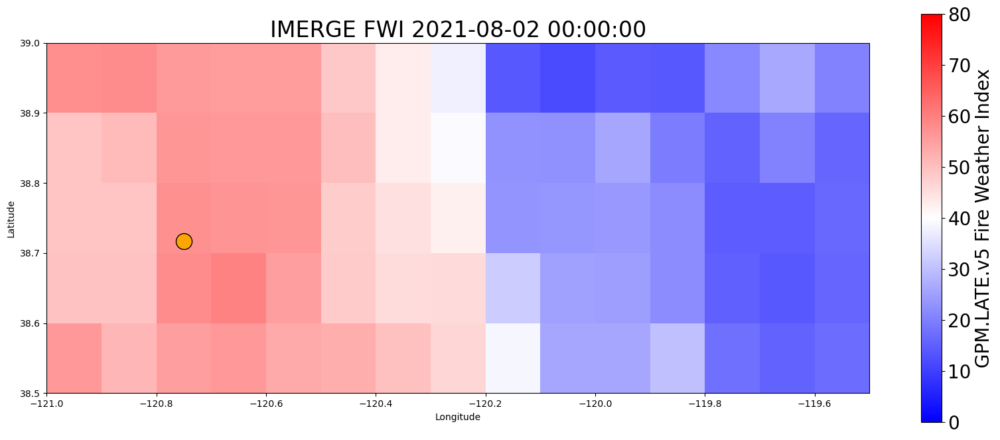

2


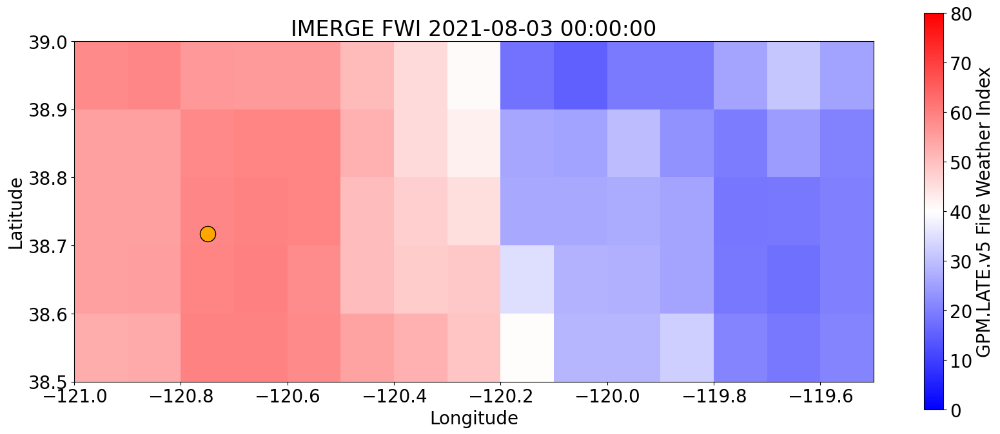

3


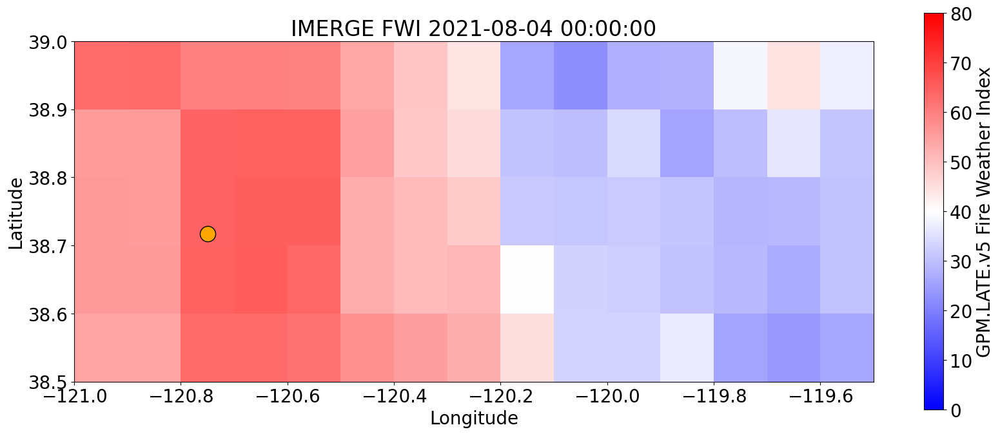

4


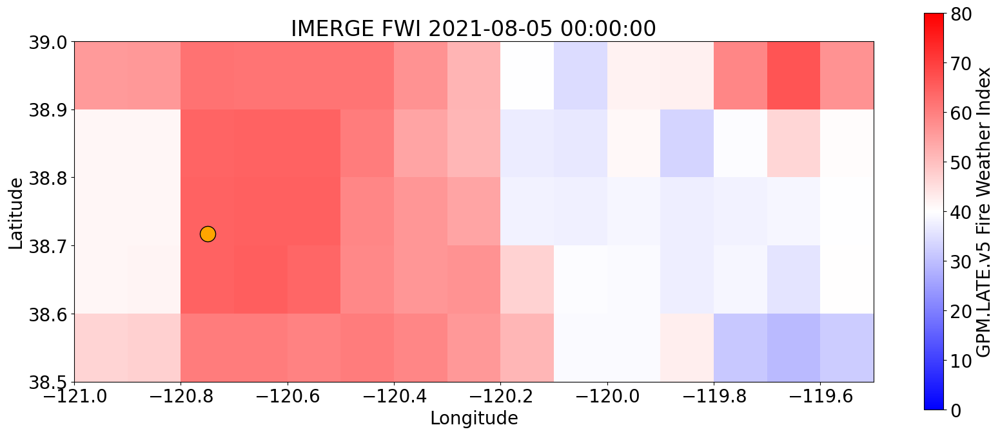

5


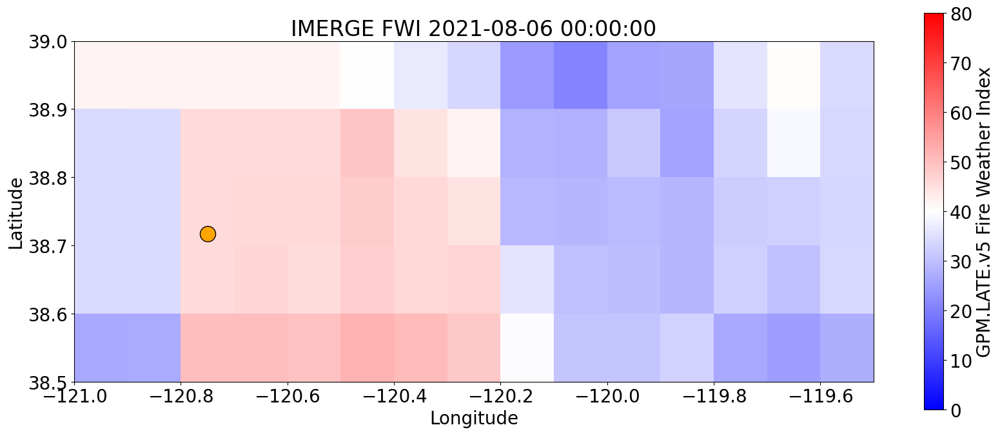

6


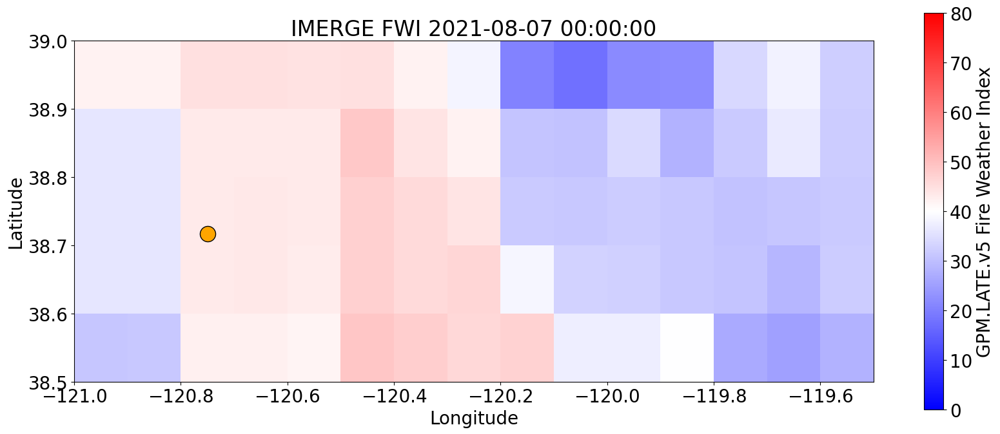

7


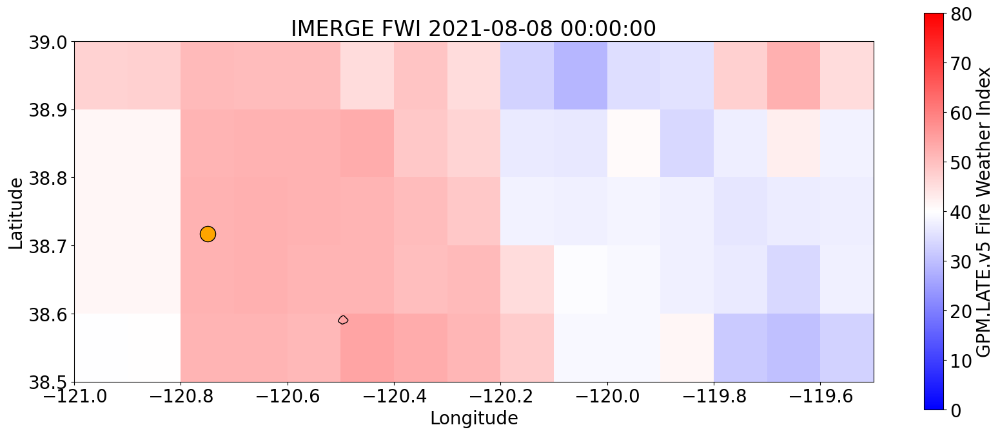

8


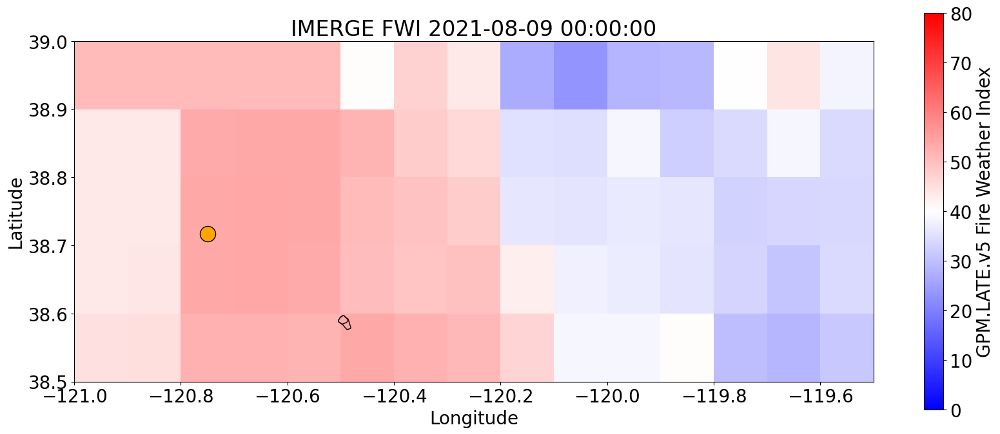

9


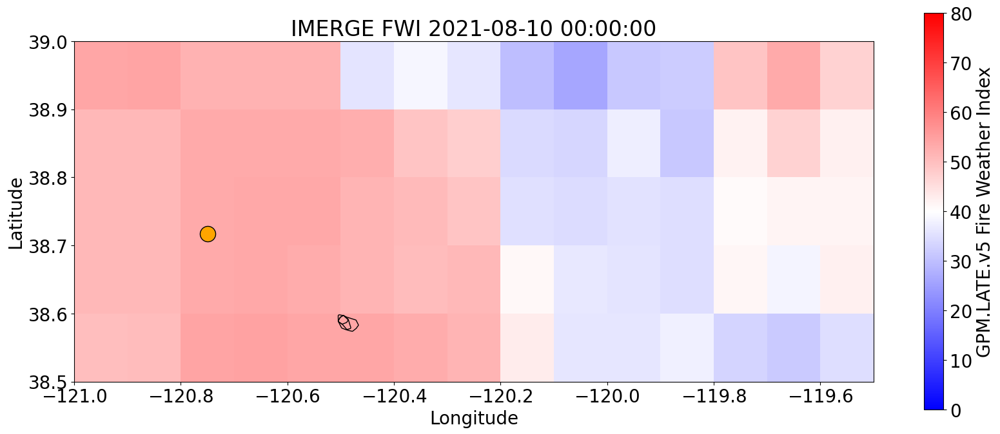

10


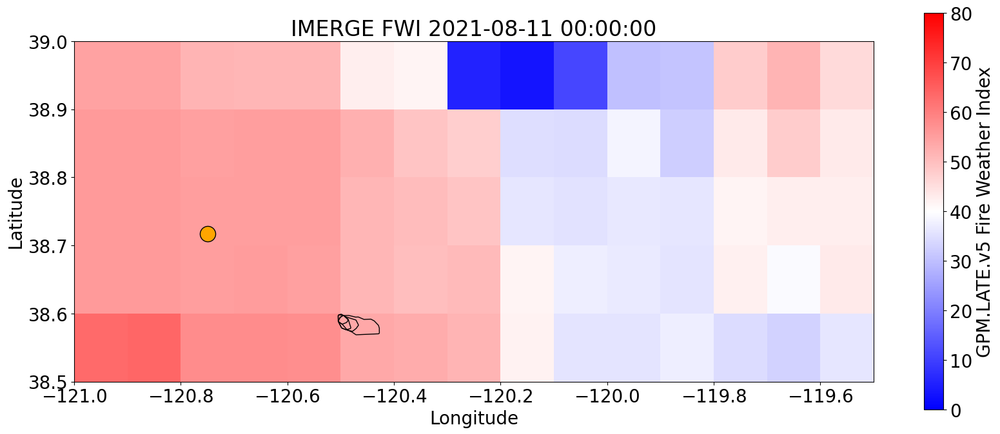

11


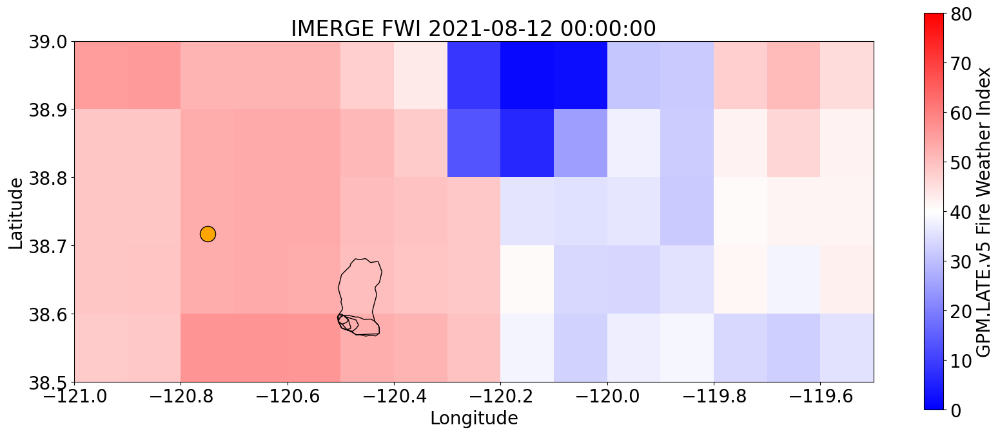

12


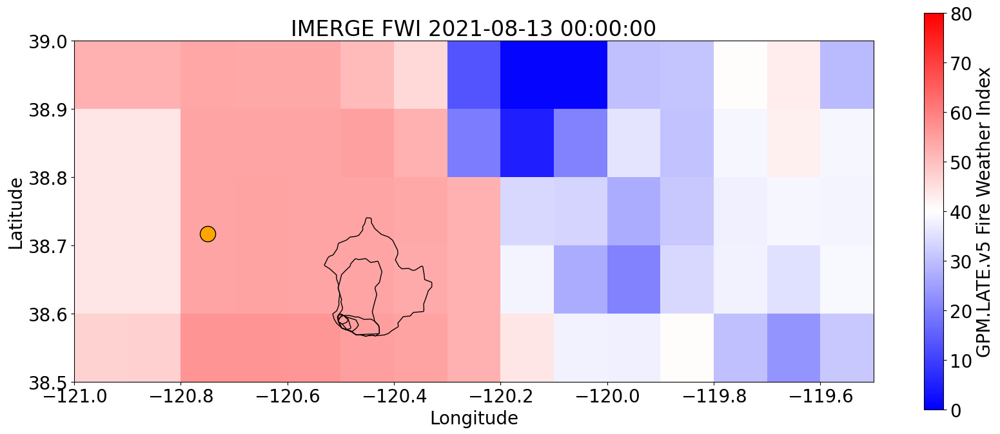

13


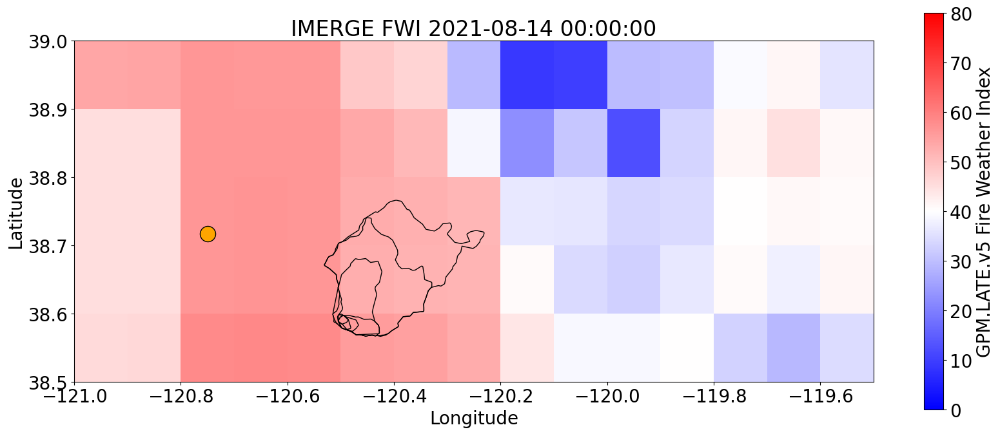

14


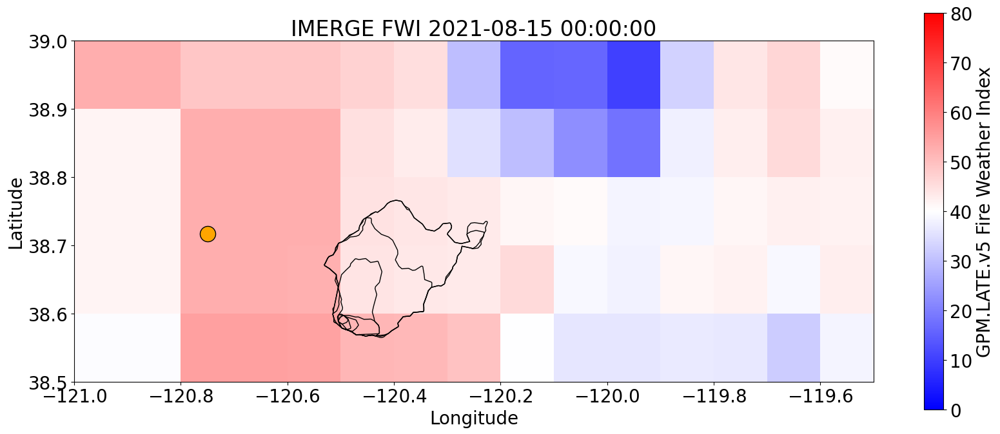

15


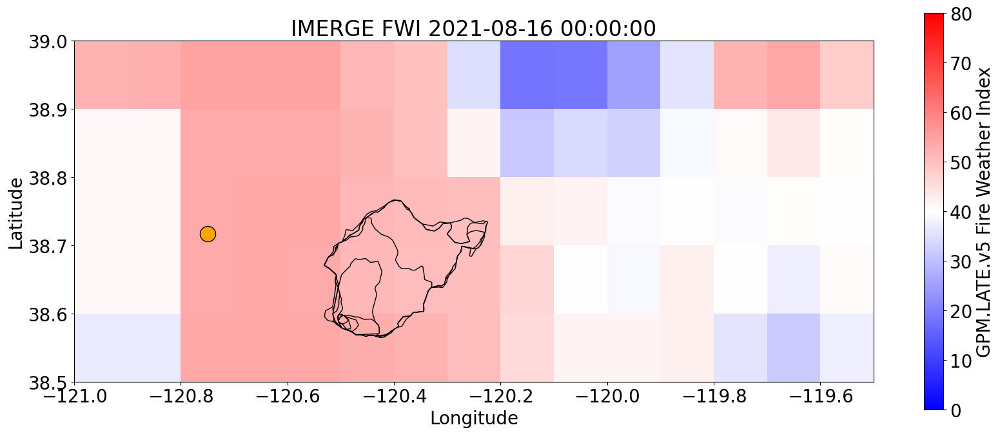

16


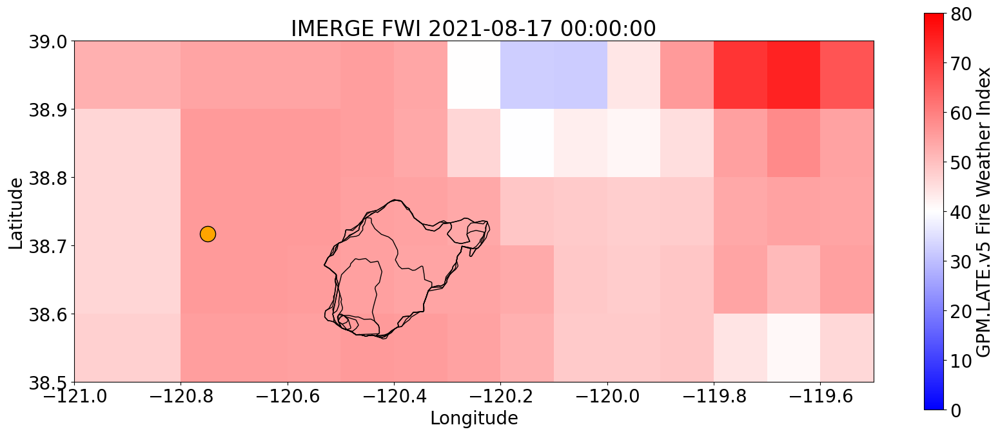

17


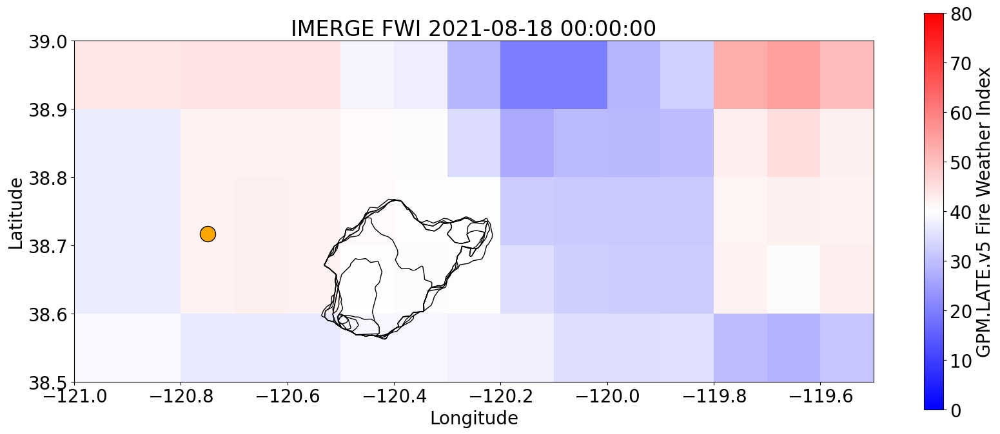

18


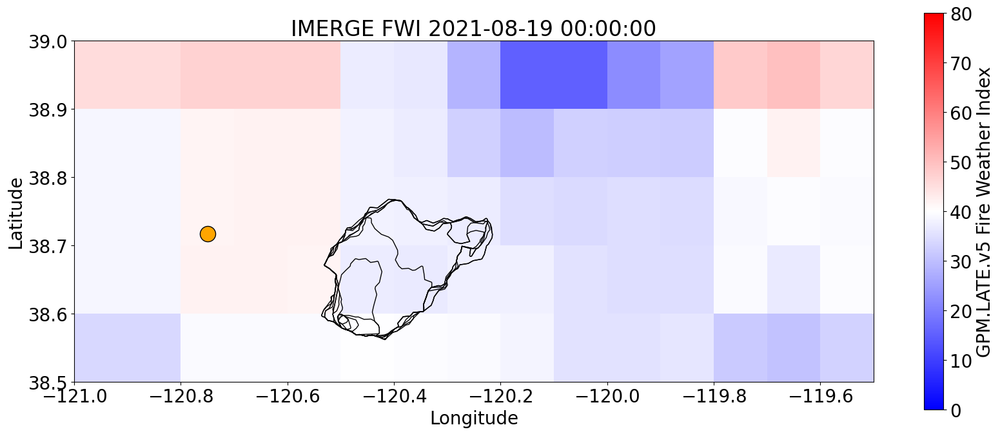

19


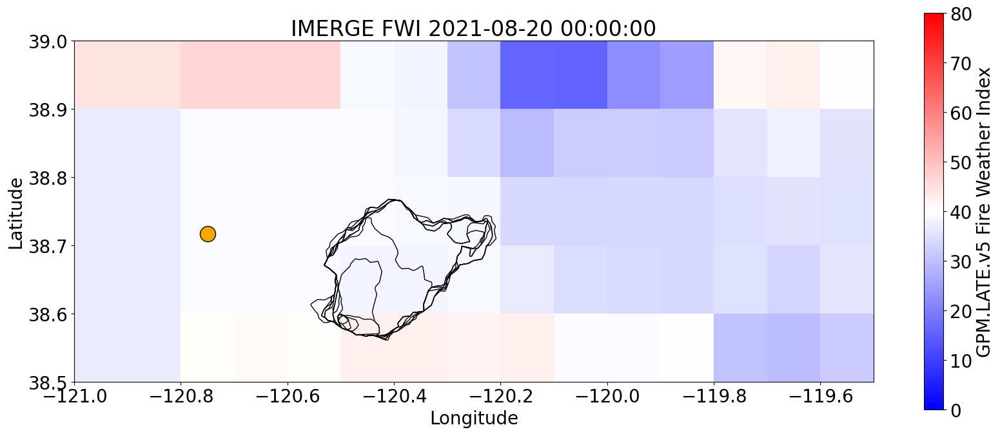

20


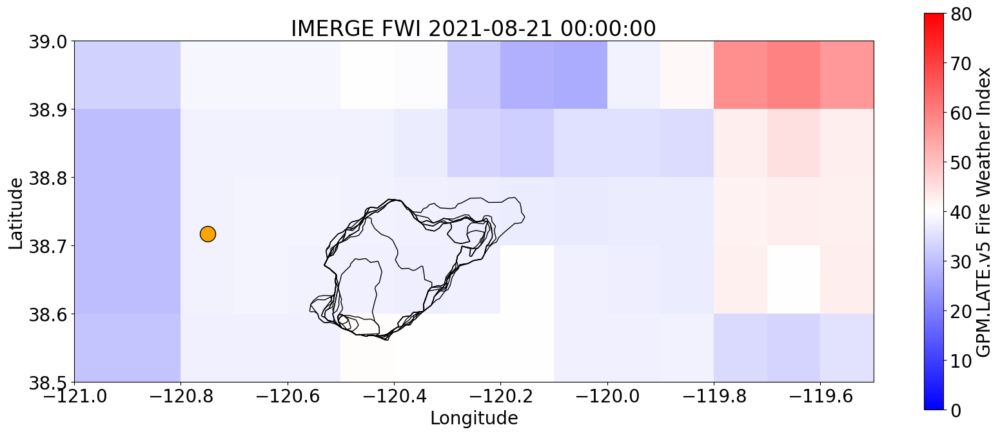

21


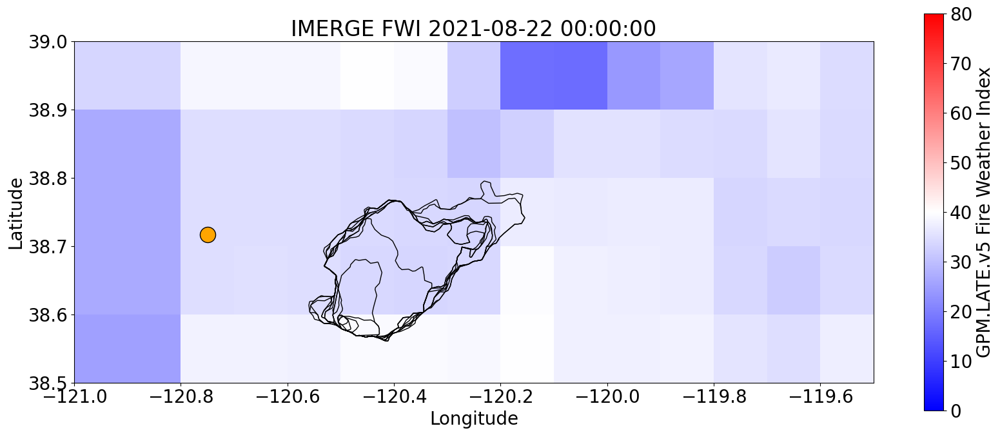

22


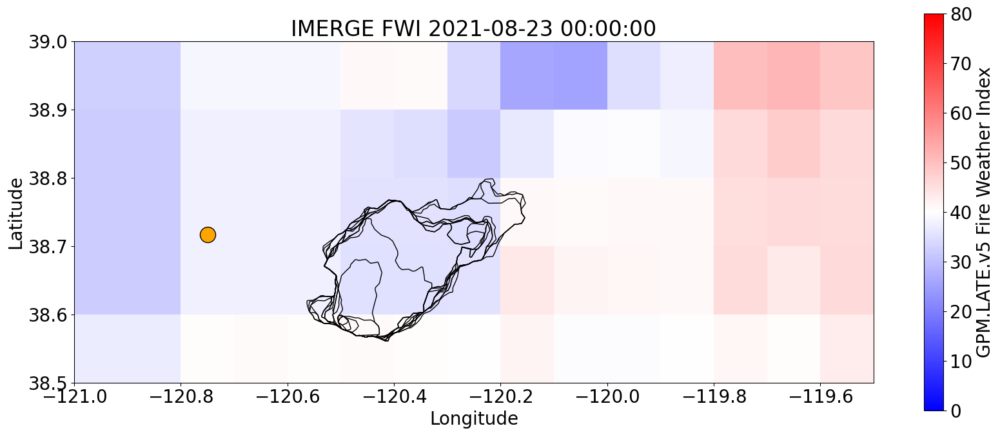

23


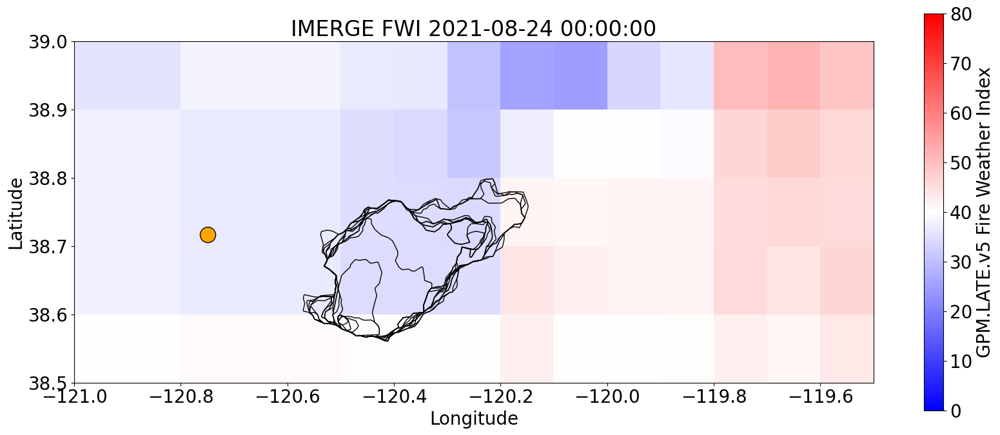

24


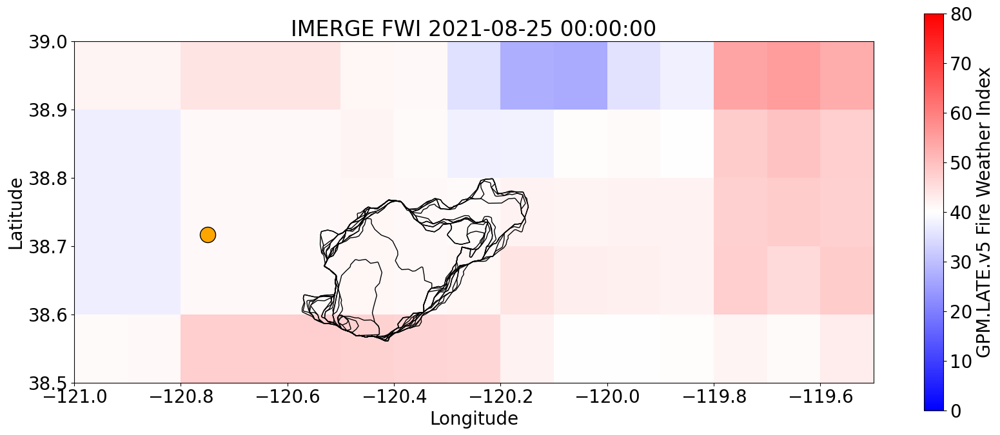

25


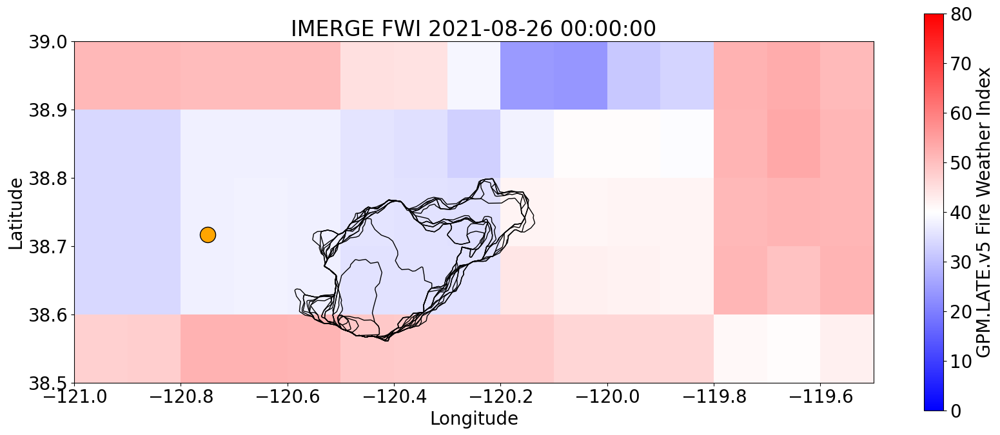

26


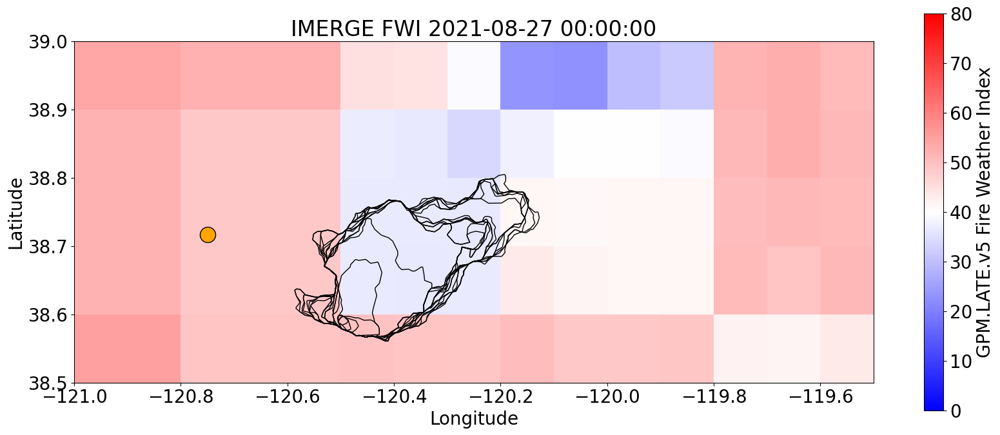

27


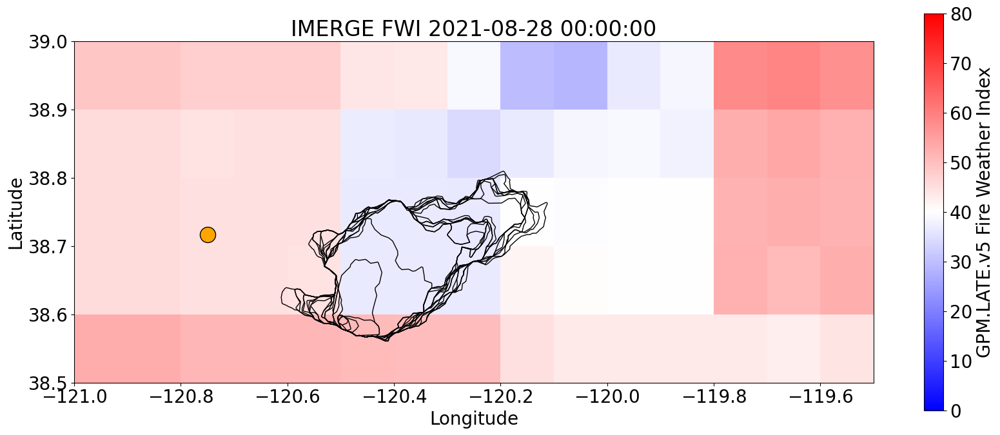

28


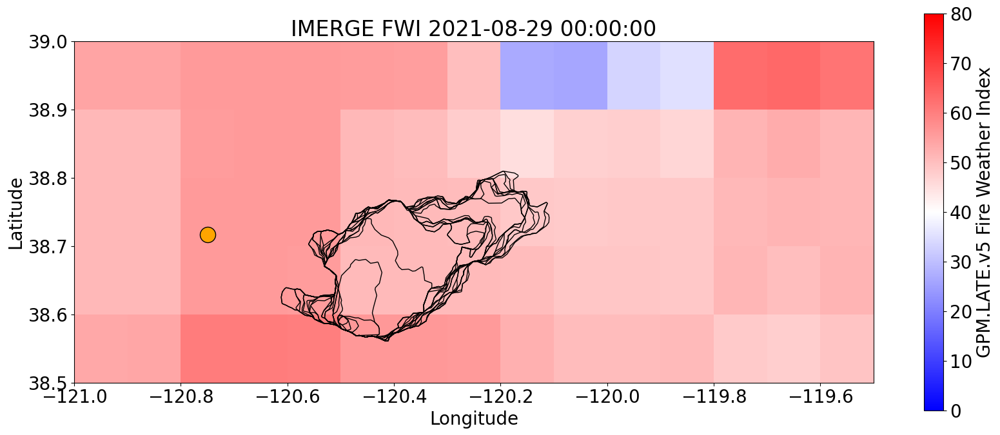

29


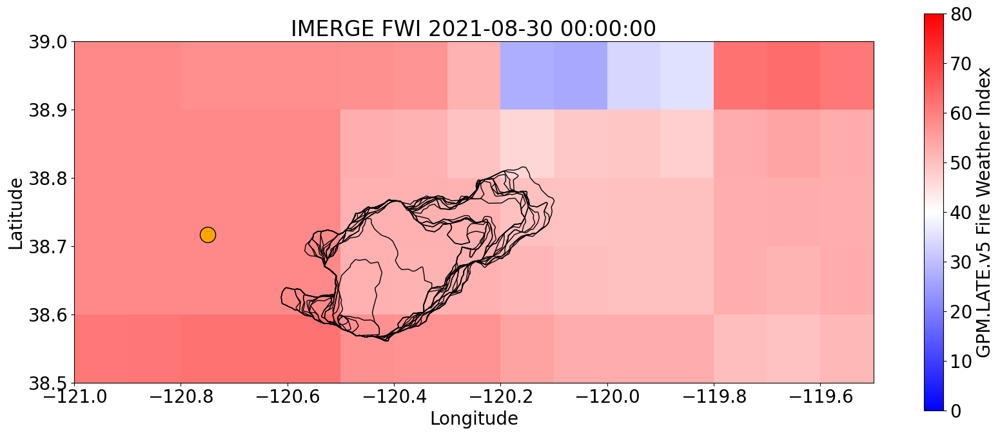

30


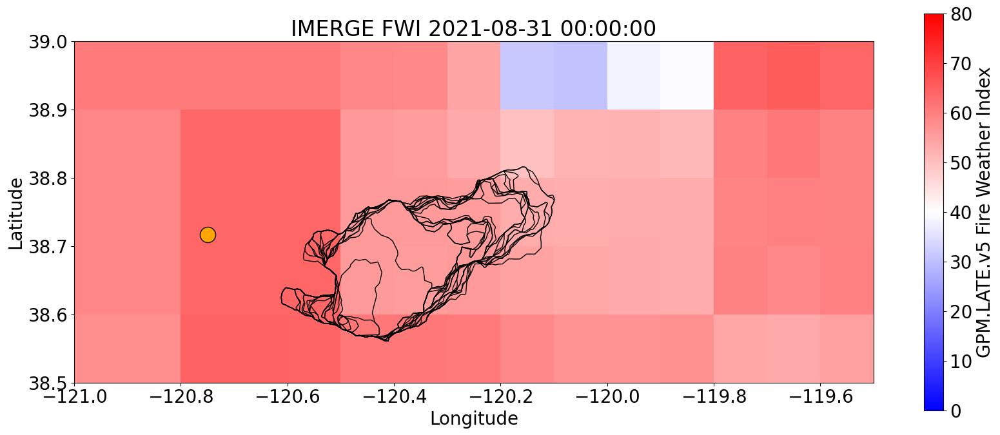

31


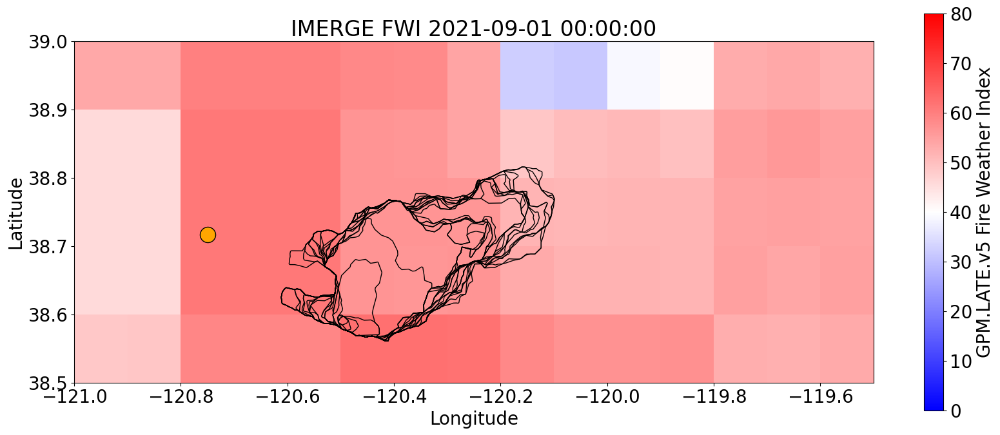

32


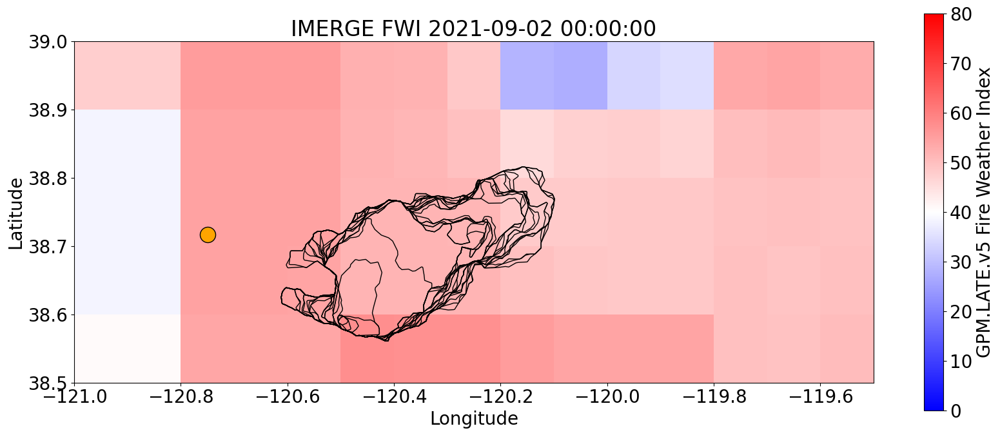

33


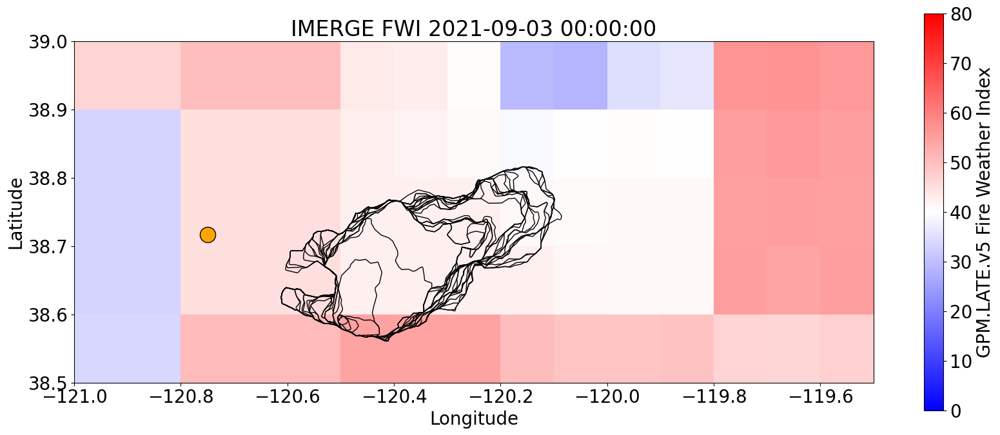

34


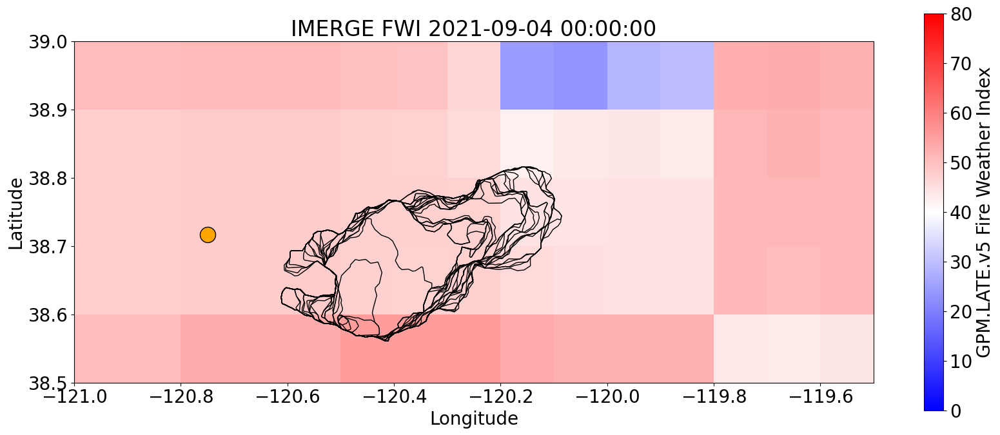

35


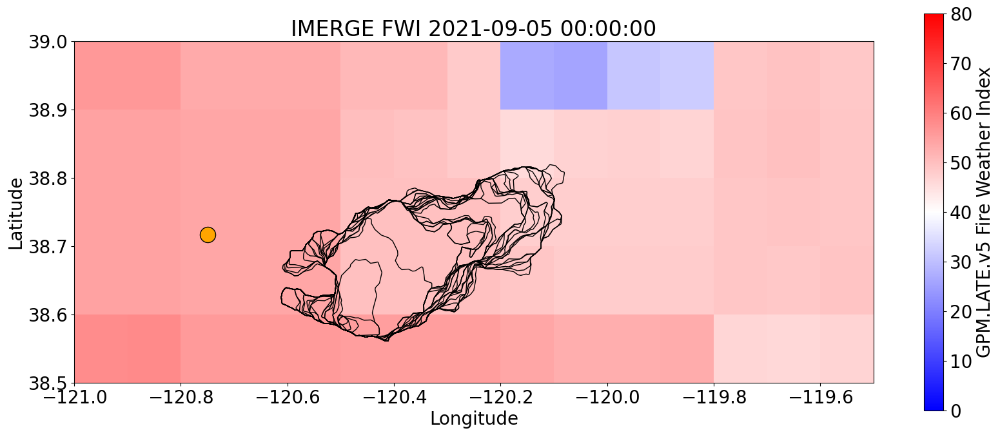

36


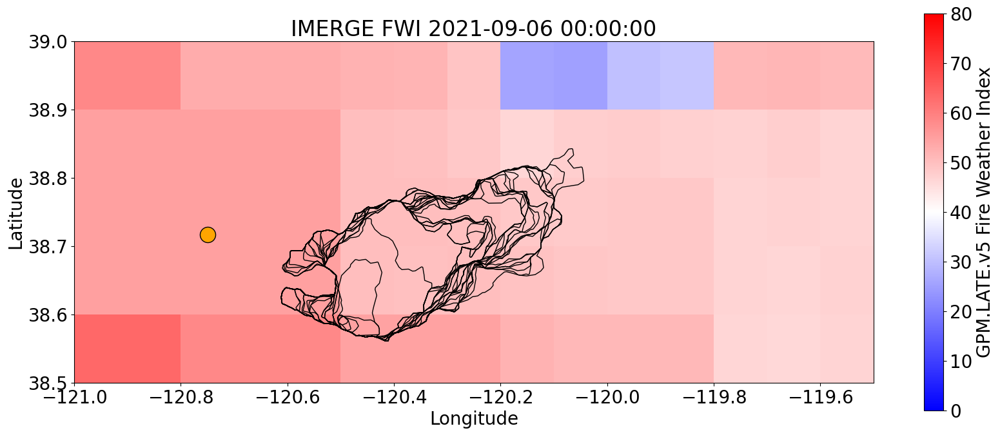

37


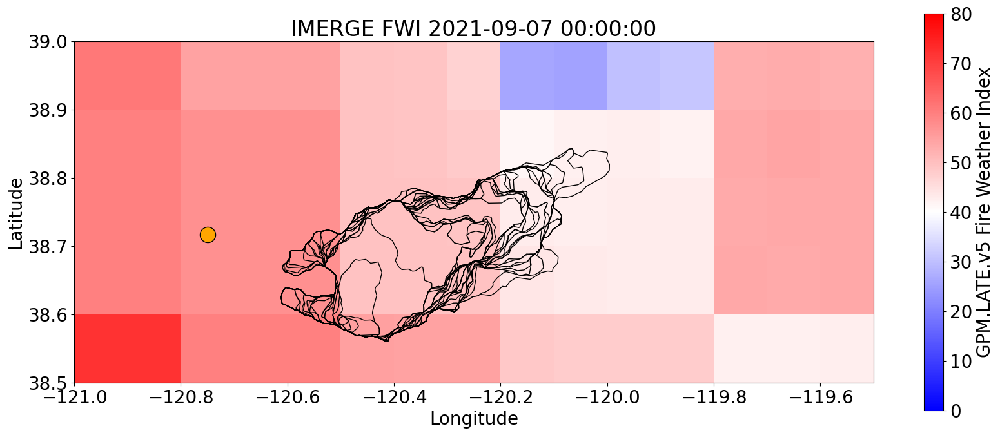

38


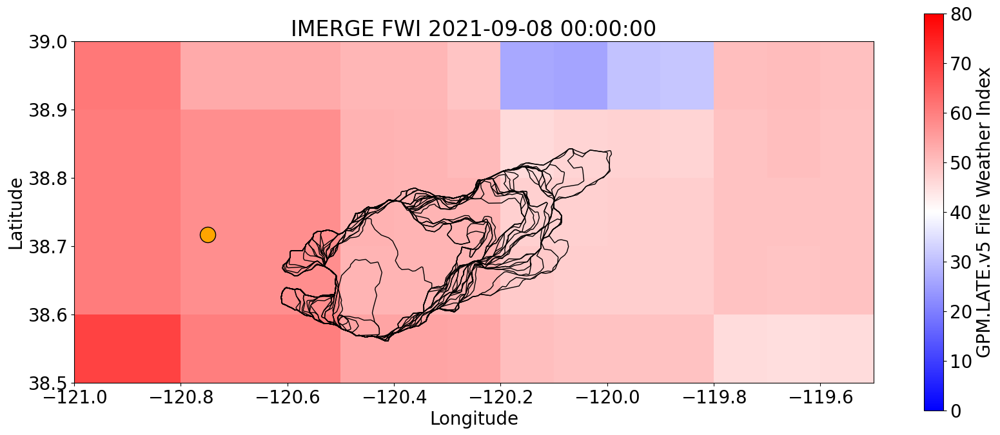

39


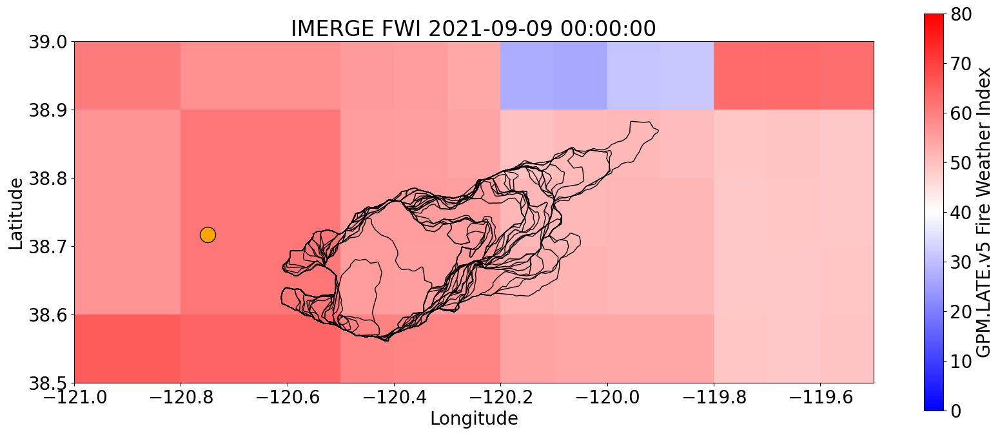

40


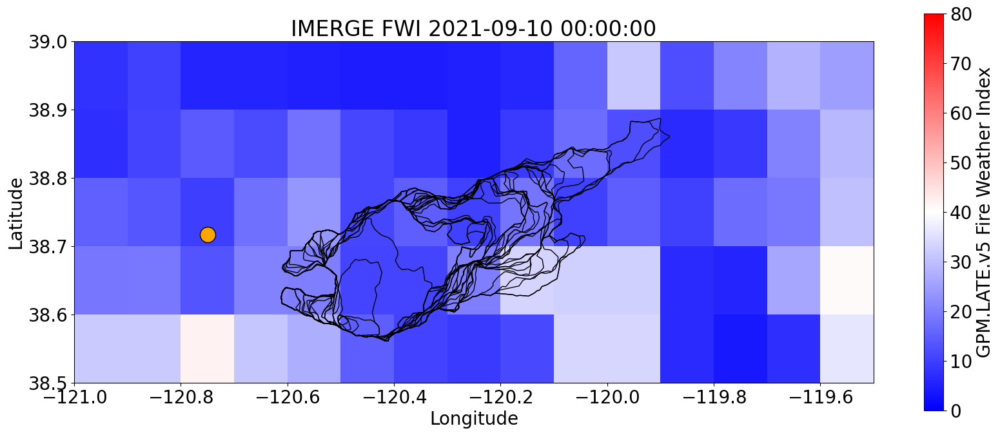

41


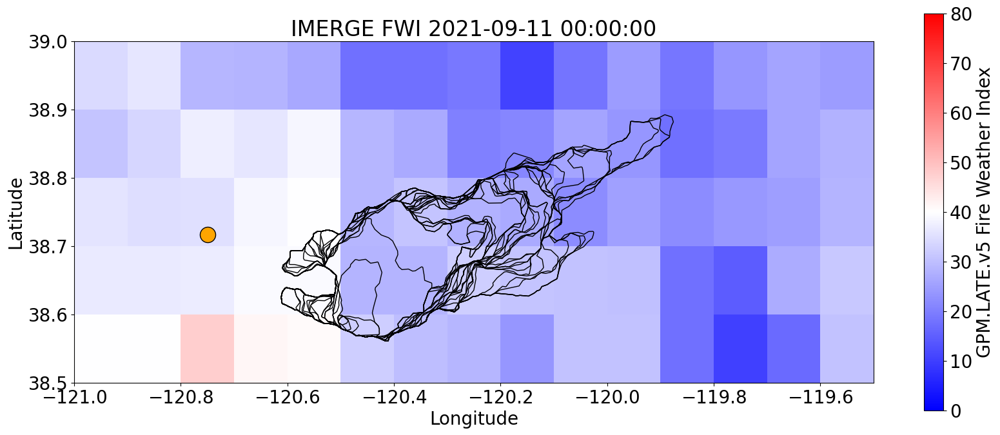

42


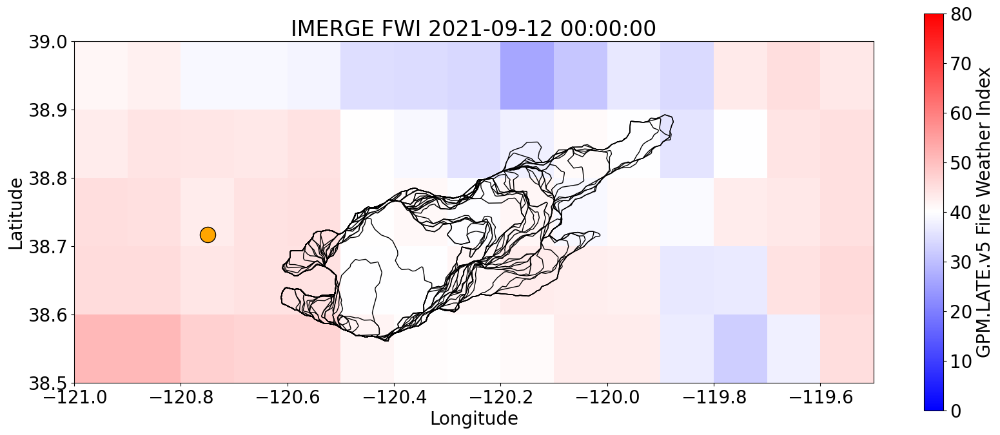

43


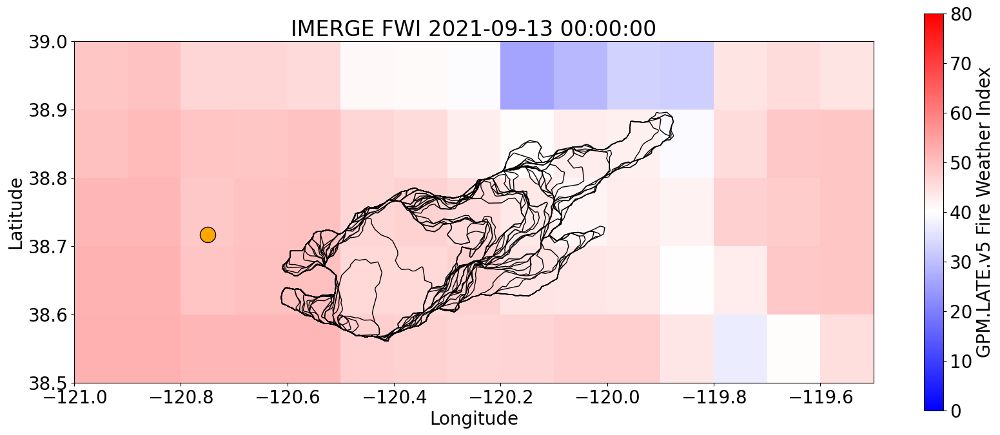

44


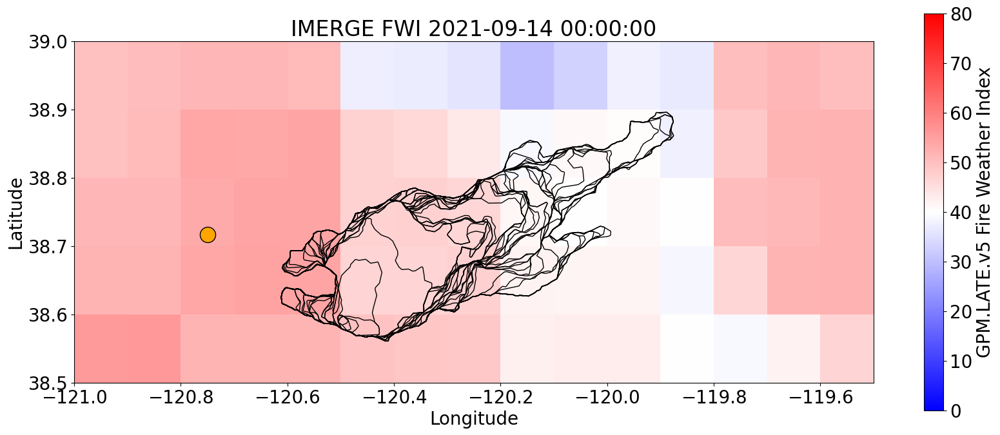

45


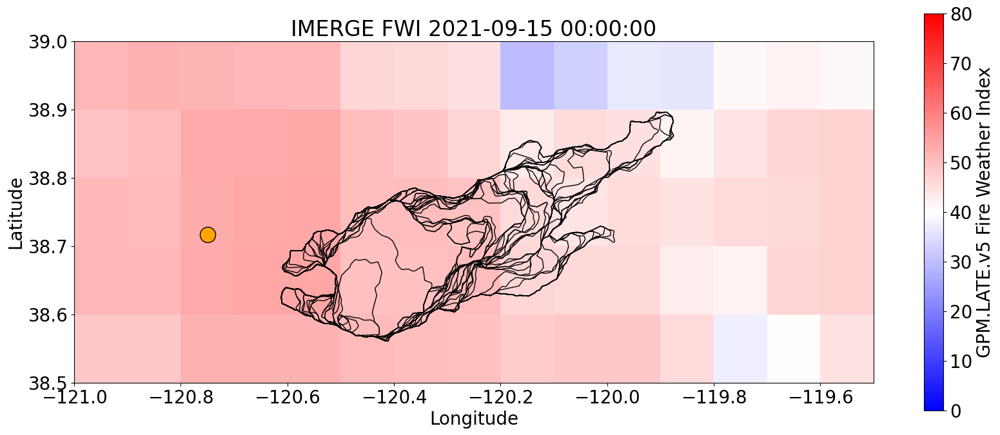

46


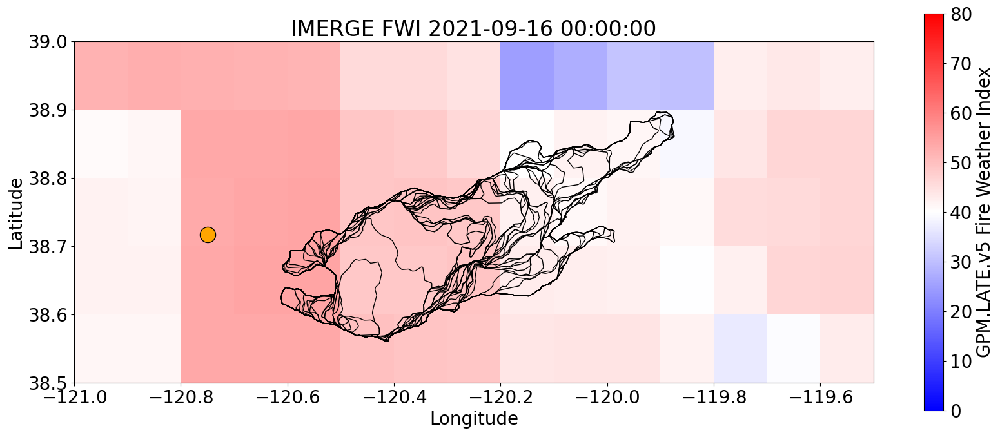

47


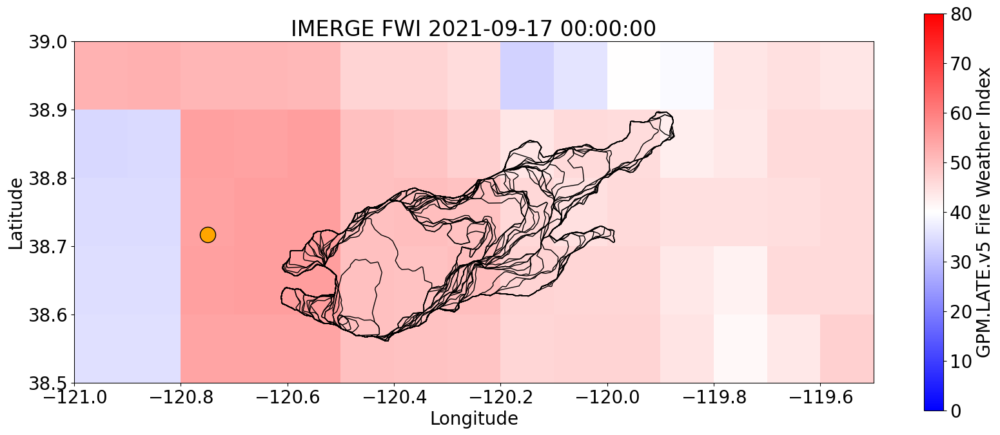

48


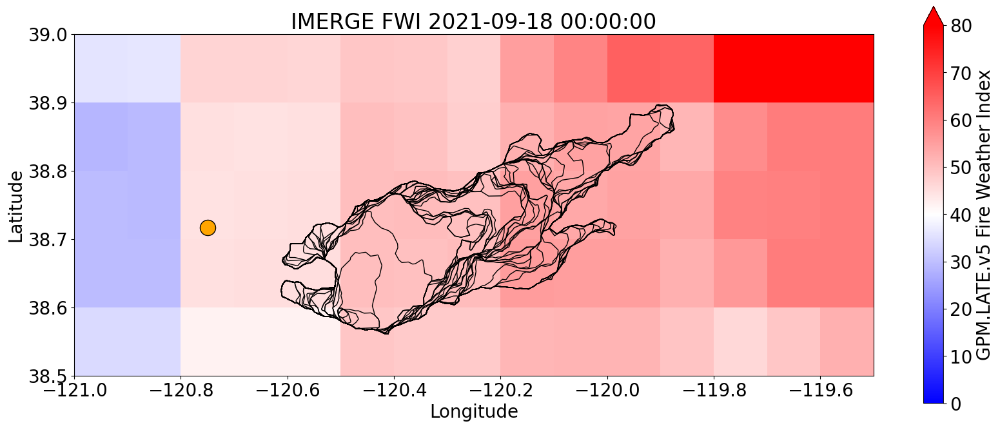

49


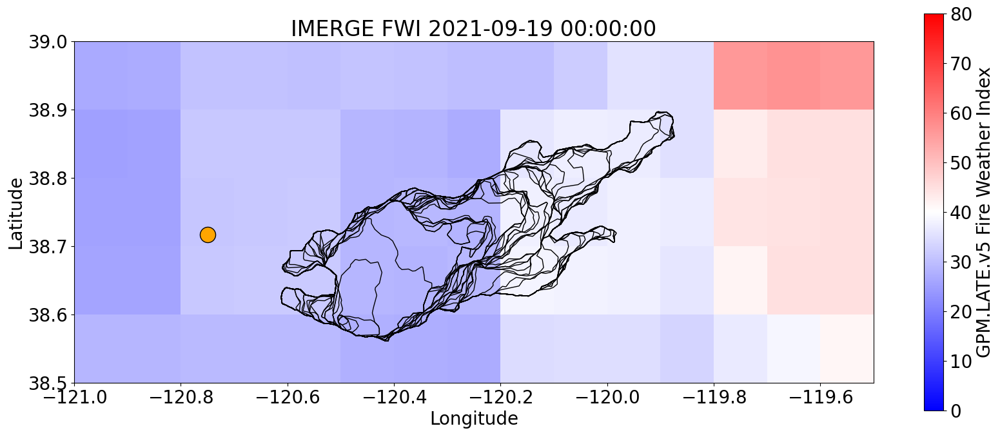

50


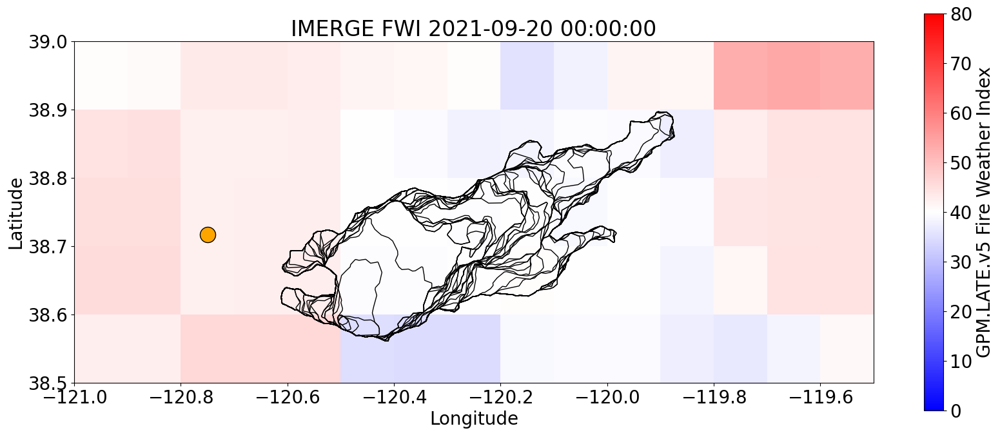

51


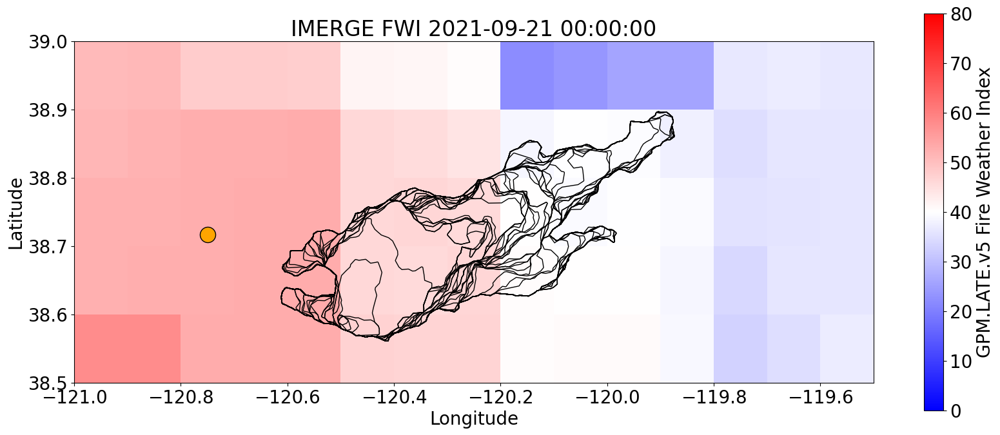

52


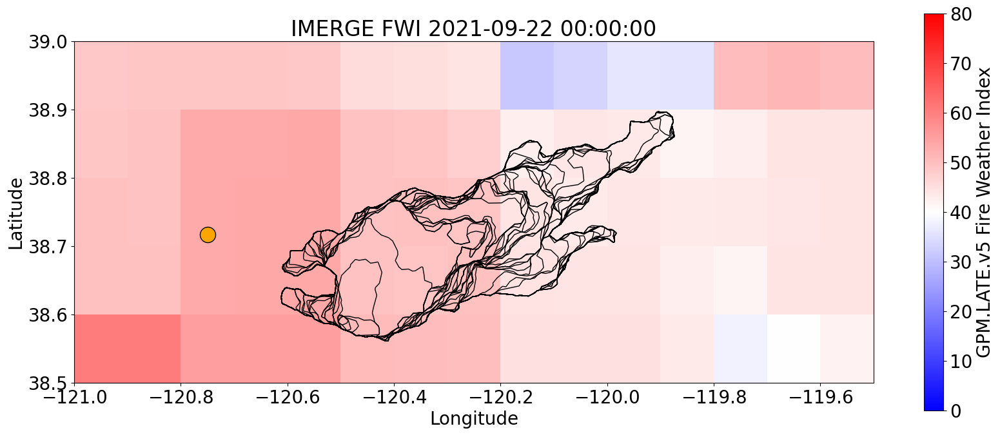

53


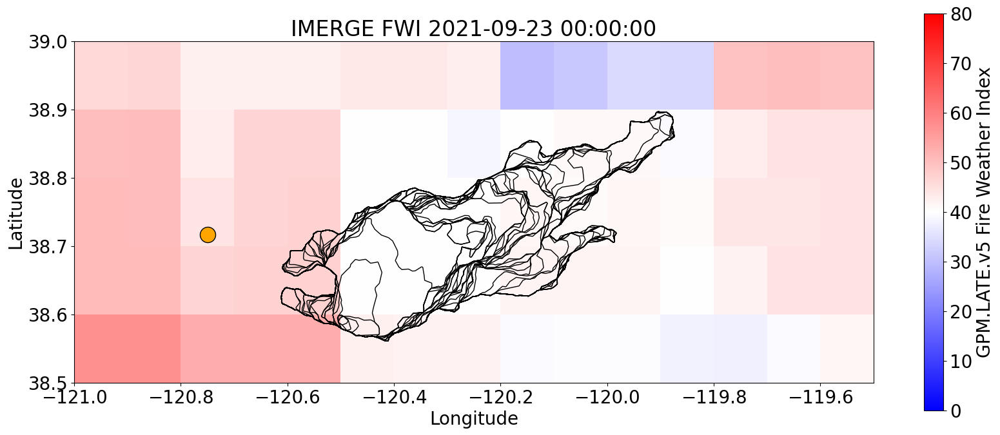

54


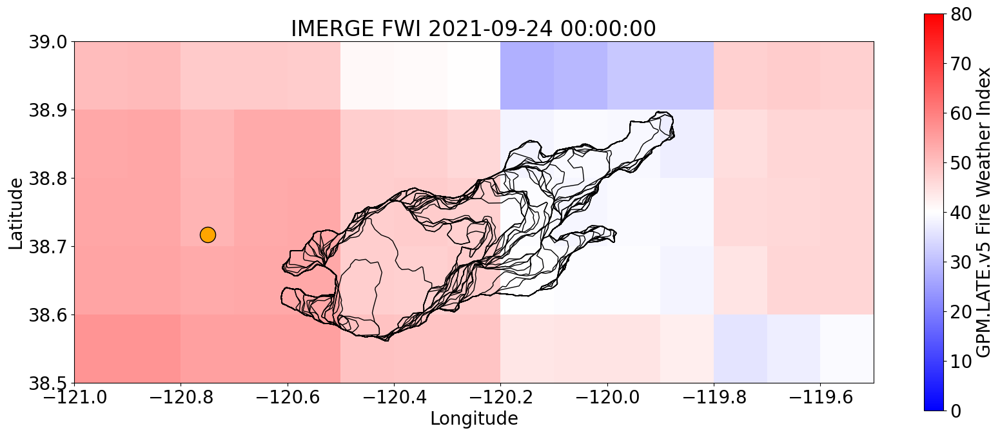

55


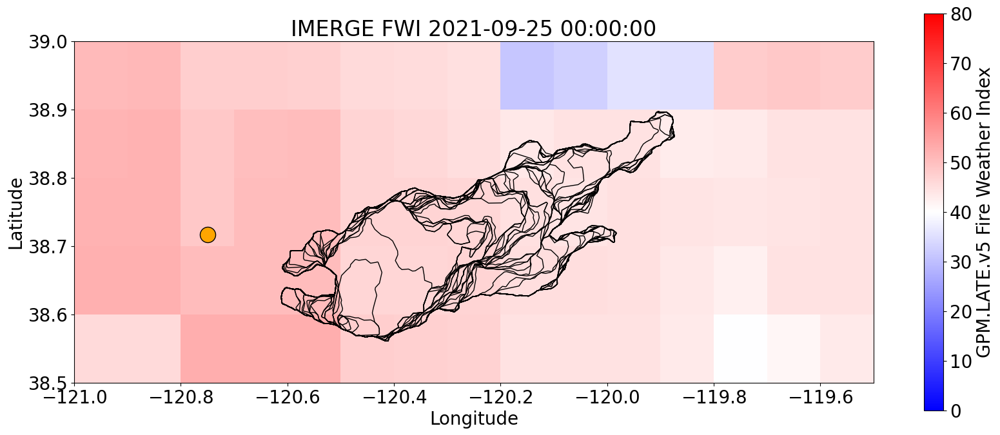

56


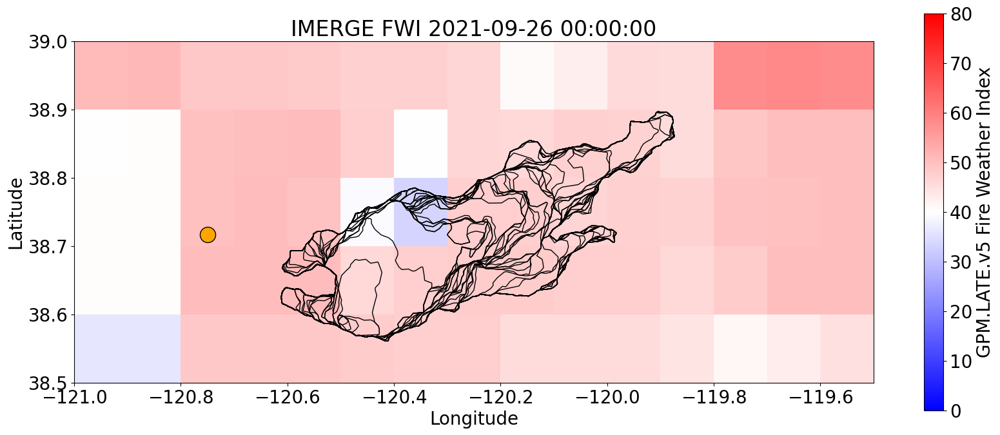

57


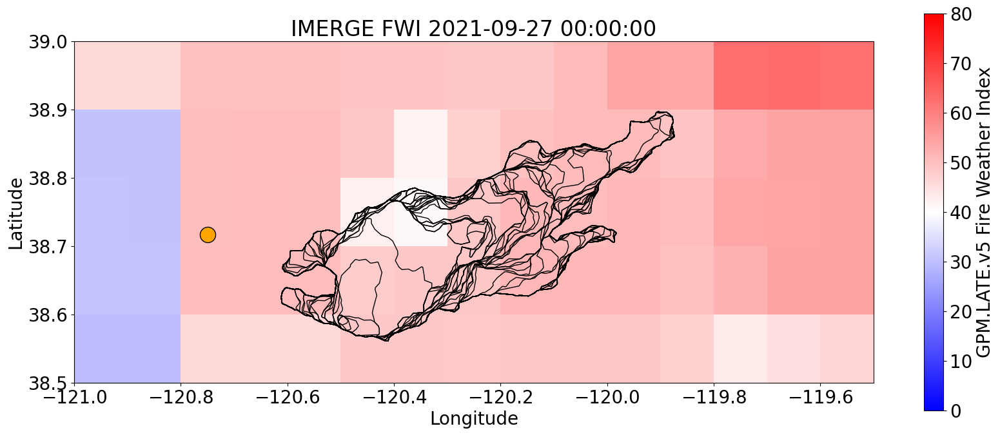

58


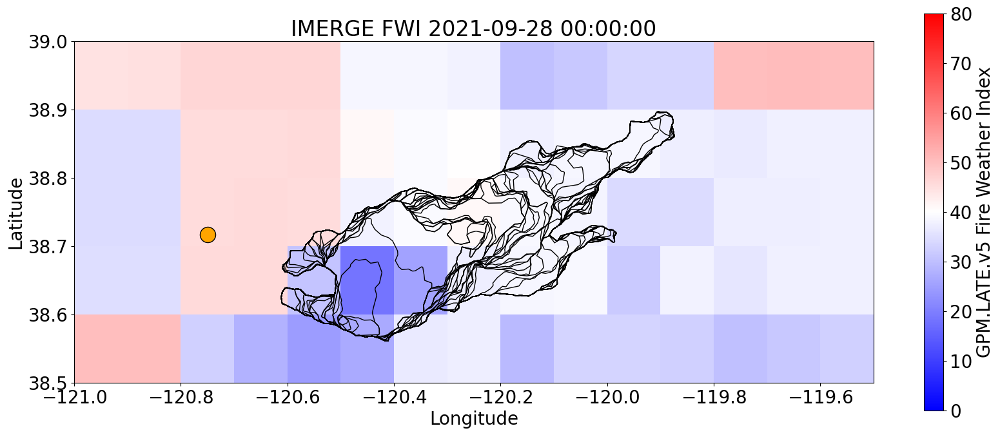

59


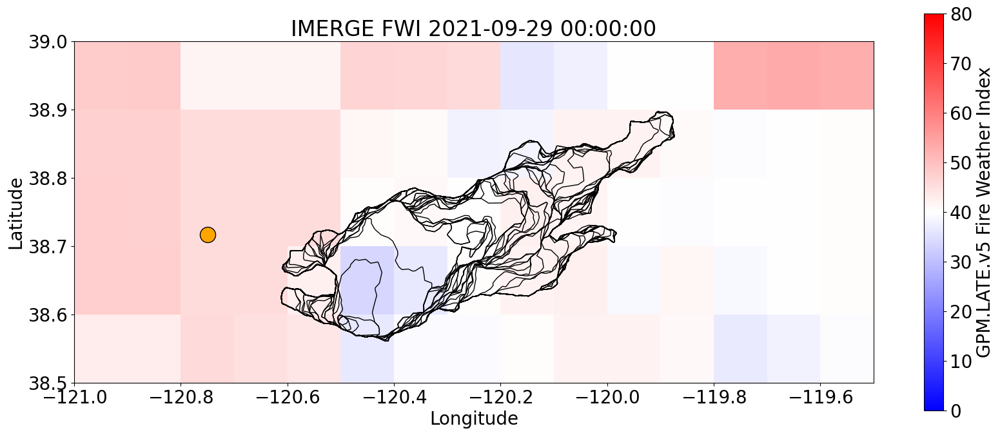

60


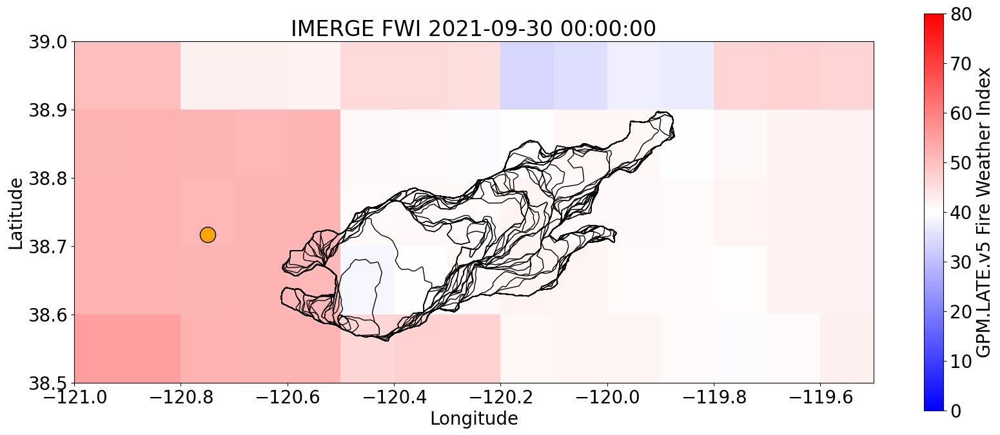

In [47]:
len_days = len(date_df.dates_fl)

for i in range(1, len_days):
    print(i)
    ## Static Plot with Doug's feedback
    f, (ax) = plt.subplots(1, figsize=(20,8))
    params = {"text.color" : "black",
              "font.size": 20, 
          "xtick.color" : "black",
          "ytick.color" : "black"}
    plt.rcParams.update(params)
        ## Adding the raster
    #root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")
    #subset = root_moist.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
    #subset.plot(ax = ax3, cmap = "bwr", vmin = 0, vmax = 100, label = "LIS FWI")
    #ax.set_xlable("Longitude")
    #ax.xlable("Longitude")
    #sub_plot = ax.plot(subset, cmap = "bwr_r", vmin= 1, vmax = 1)
    #if(i <= 6):

    #gdf[d0:i].plot(ax=ax3, facecolor="none", edgecolor='none')
    
    #if(i > 6):
    #    index = i - 6
    #    gdf[d0:index].plot(ax=ax3, facecolor="yellow", edgecolor='black') #facecolor="None"
    #ax.xlable("Longitude")
    #ax3.set_ylabel("Latitude", color = "black")
    #ax3.set_xlabel("Longitude", color = "black")
    #ax3.set_title(("LIS FWI" + str(date_df.dates_clean[i]) ), color = "black")

    #if(i < 10):
    #    i_write = "0" + str(i)
    #else:
    #    i_write = str(i)

    gsmall.sel(time = date_df.dates_clean[i]).plot(ax = ax, cmap = "bwr", vmin = 0,vmax = 80, label = " ")
    gdf[d0:i].plot(ax=ax, facecolor="none", edgecolor='none')
    ax.set_title(("IMERGE FWI" +" " +  str(date_df.dates_clean[i])))
    ax.set_ylabel("Latitude", color = "black")
    ax.set_xlabel("Longitude", color = "black")
    ax.scatter(y = 38.717, x = -120.75, color = "orange", s = 300, edgecolors= "black")
    params = {"text.color" : "black",
              "font.size": 20, 
          "xtick.color" : "black",
          "ytick.color" : "black"}
    plt.rcParams.update(params)
    
    if(i > 6):
        index = i - 6
        gdf[d0:index].plot(ax=ax, facecolor="none", edgecolor='black') #facecolor="None"
        
    if(i < 10):
       i_write = "0" + str(i)
    else:
       i_write = str(i)

    ## The save statement
    plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/imerge_caldor/FWI_Caldor_'+ i_write +'.png', dpi = 200)
    plt.show()

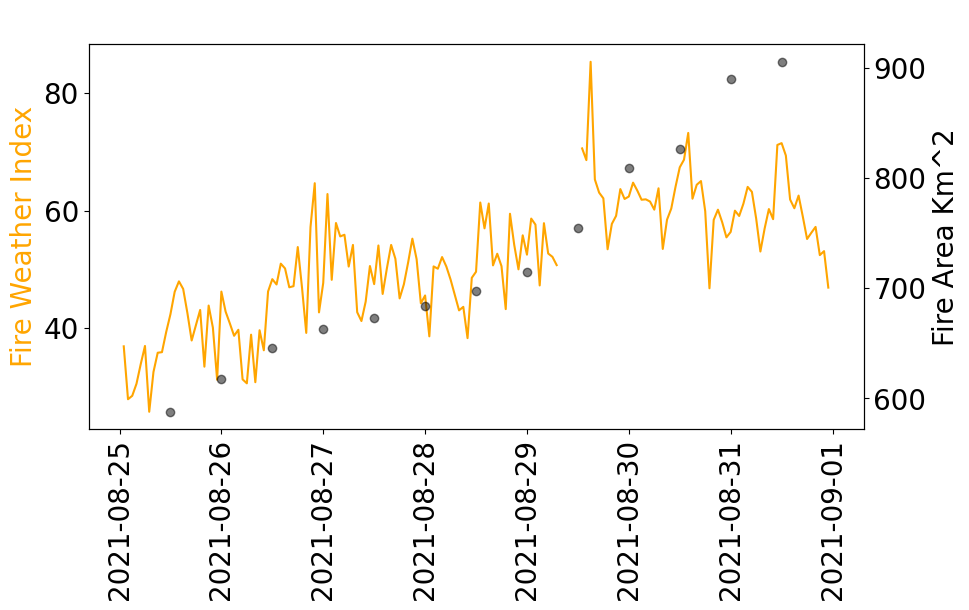

In [48]:
## Zoom in for diurnal cycle

full_fr = full_fr[full_fr.t < "2021-09-01"]
full_fr = full_fr[full_fr.t > "2021-08-25"]

## All timeseries on one plot
f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.FWI, color = "orange", label = "Placerville Airport Weather Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
#ax.plot(date_df.dates_clean, date_df.fwi_list, color = "purple", label = "LIS")
#gsmaller.sel(time = slice("2021-08-25", "2021-09-01")).plot(color = "green", label = "IMERGE FWI")
ax.set_title(" ")
ax.tick_params(axis='x', labelrotation = 90)
ax2 = ax.twinx()
ax2.scatter(full_fr.t, full_fr.farea, color = "black", label = "Fire Area", alpha = 0.5)
ax2.set_ylabel("Fire Area Km^2")
ax.set_ylabel("Fire Weather Index",color="orange")
#ax.legend(loc = 'upper left')
plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/FWI_Caldor_Imerge.png', dpi = 450)
